In [1]:
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
from glob import glob
from tqdm import tqdm
import xarray as xr
import os, sys
import scipy
import pandas as pd
from scipy.ndimage import gaussian_filter
from sklearn.decomposition import PCA, FastICA
from scipy import stats
from scipy import interpolate
from glob import glob

from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar

from allensdk.brain_observatory.ecephys.ecephys_project_cache import EcephysProjectCache

from utils import *

In [3]:
# for plotting
plt.rcParams.update({'font.size': 14})

In [4]:
exp_meta_data_dir = '../meta_data/exp'
exp_data_dir = '../processed_data/exp'
sim_data_dir =  '../processed_data/sim'

fig_dir = 'Figures/Supplementary_figures'

# Load data from experiments

In [5]:
# Load meta data
manifest_path = os.path.join(exp_meta_data_dir, 'ecephys_cache_dir_10_31', "manifest.json")
#manifest_path = os.path.join(exp_meta_data_dir, "manifest.json")
cache = EcephysProjectCache.from_warehouse(manifest=manifest_path)

## LFP and CSD

In [6]:
channels = cache.get_channels()
probes = cache.get_probes()

In [7]:
trial_window_start = -1.0
trial_window_end = 0.5


loadpaths_csd = sorted(glob(os.path.join(exp_data_dir, 'CSD', 
            'trial_window_'+str(trial_window_start).replace('.','pnt')+\
             '_to_'+str(trial_window_end).replace('.','pnt')+'s', '*.npy')))
loadpaths_lfp = sorted(glob(os.path.join(exp_data_dir, 'LFP', 'trial_window_'\
             +str(trial_window_start).replace('.','pnt')+\
             '_to_'+str(trial_window_end).replace('.','pnt')+'s', '*')))
    
len(loadpaths_csd)

53

In [8]:
twoi_start = -0.0 #
#twoi_start = -1.0 #
#twoi_end = 0.5
twoi_end = 0.1

Fs = 1250 # Hz

In [9]:
session_ids = list() # all session ids
sessions_channels_vert_pos = dict()
sessions_csd_trial_avg = dict()
sessions_csd_all_trials = dict()
sessions_channel_ids_csd = dict()

for i, file_path in enumerate(loadpaths_csd):
    session_id = os.path.basename(file_path).split('_')[0]
    print('Session id: ', session_id)
    data = np.load(file_path, allow_pickle = True)
        
    session_ids.append(session_id)
        
    t = np.array(data[()]['csd_mean']['time_from_presentation_onset'])
    t_min = twoi_start; t_max = twoi_end
    mask = np.logical_and(t>=t_min, t<=t_max)
    t = t[mask]
    
    channels_vert_pos = data[()]['channel_vertical_pos']
    channels_vert_pos = channels_vert_pos[::-1]
    channels_vert_pos -= channels_vert_pos.max()
    sessions_channels_vert_pos[session_id] = channels_vert_pos
    
    mask_session = channels['ecephys_session_id'] == int(session_id)
    mask_structure = channels[mask_session]['ecephys_structure_acronym'] == 'VISp'
    dorsal_ventral_ccf_coordinate = channels[mask_session][mask_structure]['dorsal_ventral_ccf_coordinate']
    channel_ids_csd = data[()]['csd_mean'].channel.values
    dorsal_ventral_ccf_coordinate = -(dorsal_ventral_ccf_coordinate[channel_ids_csd]-dorsal_ventral_ccf_coordinate[channel_ids_csd].min())# higher dorsal-ventral value means more ventral
    
    if ~np.all(np.isnan(dorsal_ventral_ccf_coordinate)): # if all NaNs it means exact probe location not recovered
        csd_trial_avg = data[()]['csd_mean']
        csd_trial_avg = csd_trial_avg[:,mask]
        sessions_csd_trial_avg[session_id] = csd_trial_avg.values*1E-3

        csd_all_trials = data[()]['csd']
        csd_all_trials = csd_all_trials[:,:,mask]
        sessions_csd_all_trials[session_id] = csd_all_trials.values
        
        sessions_channel_ids_csd[session_id] = channel_ids_csd

Session id:  715093703
Session id:  719161530
Session id:  721123822
Session id:  732592105
Session id:  737581020
Session id:  739448407
Session id:  742951821
Session id:  744228101
Session id:  746083955
Session id:  750332458
Session id:  750749662
Session id:  751348571
Session id:  754312389
Session id:  754829445
Session id:  755434585
Session id:  756029989
Session id:  757216464
Session id:  757970808
Session id:  758798717
Session id:  759883607
Session id:  760345702
Session id:  760693773
Session id:  761418226
Session id:  762120172
Session id:  762602078
Session id:  763673393
Session id:  766640955
Session id:  767871931
Session id:  768515987
Session id:  771160300
Session id:  771990200
Session id:  773418906
Session id:  774875821
Session id:  778240327
Session id:  778998620
Session id:  779839471
Session id:  781842082
Session id:  786091066
Session id:  787025148
Session id:  789848216
Session id:  791319847
Session id:  793224716
Session id:  794812542
Session id:

### Load channel depth data

In [10]:
#filename = 'cortical_depth_'+str(session_id)+'.csv'
#loadpath = os.path.join(exp_meta_data_dir, 'probes_cortical_depths', filename)
sessions_df_depth = dict()
loadpaths = sorted(glob(os.path.join(exp_meta_data_dir, 'probes_cortical_depths', '*')))
for loadpath in loadpaths:
    session_id = loadpath.split('/')[-1].split('.')[0].split('_')[-1]
    df_depth = pd.read_csv(loadpath, sep=' ')
    df_depth = df_depth.set_index('id')
    sessions_df_depth[session_id] = df_depth

#### Remove faulty channels

In [11]:
structure = 'VISp'
sessions_channels_cort_depth = dict()

for session_id in sessions_df_depth.keys():
    df_depth = sessions_df_depth[session_id]
    mask_structure = df_depth.ecephys_structure_acronym == structure
    df_depth = df_depth[mask_structure]
    channels_cort_depth = df_depth.cortical_depth
        
    if session_id in sessions_channel_ids_csd.keys():
        print('Session ID: ', session_id)
        
        channel_ids_csd = sessions_channel_ids_csd[session_id]
    
        channels_cort_depth = channels_cort_depth[channel_ids_csd]      
        sessions_channels_cort_depth[session_id] = channels_cort_depth.values
        
print('\n ---------------------------------------------- \n')
sessions_channels_cort_depth_cleaned = dict()
for session_id, channels_cort_depth in sessions_channels_cort_depth.items():
    channels_cort_depth = channels_cort_depth[::-1]
    
    mask_nan = np.isnan(channels_cort_depth)
    
    channels_cort_depth_no_nan = channels_cort_depth[~mask_nan][::-1]
    
    if mask_nan.sum() > 0:
        print('Session ID: ', session_id, 'has NaN channels', channels_cort_depth, '\n', channels_cort_depth_no_nan, '\n', len(channels_cort_depth_no_nan))
        
    mask_zeros_after_1st_chan = channels_cort_depth_no_nan == 0
    
    if mask_zeros_after_1st_chan[1:].sum() > 0:
        end_chan = np.where(mask_zeros_after_1st_chan[1:])[0][0]+1

        channels_cort_depth_cleaned = channels_cort_depth_no_nan[:end_chan]

        print('Session ID: ', session_id, 'has channels outside cortex. Removed.', \
              channels_cort_depth_no_nan, '\n', channels_cort_depth_cleaned, len(channels_cort_depth_cleaned))
    
        sessions_channels_cort_depth_cleaned[session_id] = channels_cort_depth_cleaned
    else:
        sessions_channels_cort_depth_cleaned[session_id] = channels_cort_depth_no_nan
        
sessions_csd_trial_avg_short = dict()
sessions_csd_all_trials_short = dict()
for isess, session_id in enumerate(sessions_csd_trial_avg.keys()):
    csd_trial_avg = sessions_csd_trial_avg[session_id]
    csd_all_trials = sessions_csd_all_trials[session_id]
    
    channels_vert_pos = sessions_channels_vert_pos[session_id]
    
    cut_off_chan = len(sessions_channels_cort_depth_cleaned[session_id])
    
    #print(isess, session_id, csd_trial_avg.shape[0], channels_vert_pos[-1], \
    #      channels_vert_pos[:cut_off_chan].shape, channels_vert_pos[:cut_off_chan][-1])#,\

    sessions_csd_trial_avg_short[session_id] = csd_trial_avg[:cut_off_chan]
    sessions_csd_all_trials_short[session_id] = csd_all_trials[:cut_off_chan]

Session ID:  715093703
Session ID:  719161530
Session ID:  721123822
Session ID:  744228101
Session ID:  750749662
Session ID:  751348571
Session ID:  754312389
Session ID:  754829445
Session ID:  755434585
Session ID:  756029989
Session ID:  757216464
Session ID:  757970808
Session ID:  758798717
Session ID:  759883607
Session ID:  760345702
Session ID:  761418226
Session ID:  762602078
Session ID:  763673393
Session ID:  766640955
Session ID:  767871931
Session ID:  768515987
Session ID:  771160300
Session ID:  771990200
Session ID:  773418906
Session ID:  774875821
Session ID:  778240327
Session ID:  778998620
Session ID:  779839471
Session ID:  781842082
Session ID:  786091066
Session ID:  787025148
Session ID:  789848216
Session ID:  791319847
Session ID:  793224716
Session ID:  794812542
Session ID:  797828357
Session ID:  798911424
Session ID:  799864342
Session ID:  816200189
Session ID:  829720705
Session ID:  831882777
Session ID:  835479236
Session ID:  839068429
Session ID:

#### Load meta data

In [12]:
units = cache.get_units()

## Load simulation data

In [17]:
selected_sims_data_dir = os.path.join(sim_data_dir, 'model_versions')

In [18]:
nchan_sim = 23           # Number of channels on probe in simulation

trial_dur_sim = 750      # Duration one trial (ms)
tstim_onset_sim = 250    # Stimulus onset in each trial (ms)
ntrials_sim = 10         # Number of trials

### CSD

#### Total CSD

In [19]:
csd_sims = find_files(selected_sims_data_dir, filename = 'csd_total.npy')

print('Total CSD from model versions: ', list(csd_sims.keys()))

old_model
intermediate_model
final_model
Total CSD from model versions:  ['old_model', 'intermediate_model', 'final_model']


#### Population contributions to the CSD

In [16]:
csd_sims_layerpops = find_files(selected_sims_data_dir, filename = 'csd_layerpop_contributions_summed.npy')

for sim_name in list(csd_sims_layerpops.keys()):
    if 'final' not in sim_name:
        del csd_sims_layerpops[sim_name]

print('Population CSD from model versions', list(csd_sims_layerpops.keys()))

old_model
intermediate_model
final_model
Population CSD from model versions ['final_model']


# Make figures

### Sim CSD

In [20]:

step_depth_ticks_sim = 5
step_depth_ticklabels_sim = 200
#nchan_sim = csd_sims[list(csd_sims.keys())[0]]['trial_avg'].shape[0]
nchan_sim = 23
if nchan_sim == 51:
    nchan_sim = int(csd_sims[list(csd_sims.keys())[0]][()]['trial_avg'].shape[0]/2)+1
depth_ticks_sim = np.arange(0, nchan_sim, step_depth_ticks_sim)
depth_ticklabels_sim = -np.arange(0, 1000, step_depth_ticklabels_sim, dtype = 'int')

step_time_ticks_sim = 20
time_tick_stop_sim = 100
time_tick_start_sim = 0
time_ticks_sim = np.arange(time_tick_start_sim, time_tick_stop_sim+step_time_ticks_sim, step_time_ticks_sim)
time_ticklabels_sim = np.arange(time_tick_start_sim, time_tick_stop_sim+step_time_ticks_sim, step_time_ticks_sim)

In [21]:
sims_labels = dict()

sims_labels['old_model'] = 'Original model'
sims_labels['intermediate_model'] = 'Model w/adjusted\n syn. weights'
sims_labels['final_model'] = 'Final model \nw/feedback and LGN'

sims_colors = dict()
sims_colors['old_model'] = 'b'
sims_colors['intermediate_model'] = 'g'
sims_colors['final_model'] = 'tab:orange'

In [22]:
list(csd_sims.keys())[-1]

'final_model'

Text(0.5, 0, 'Time from flash onset (ms)')

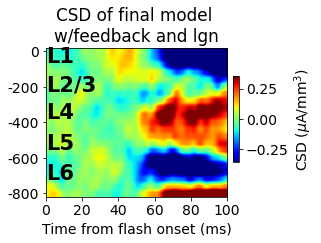

In [23]:
scale_to_uA = 1E-3

fig, ax = plt.subplots(1,1, figsize = (4,3))

fig.subplots_adjust(hspace = 0.4, wspace = 0.1, left = 0.12, right = 0.75, top = 0.83, bottom = 0.14)

sim_name = 'final_model'
        
csd_sim = csd_sims[sim_name]
csd_plot = csd_sim['trial_avg'][:nchan_sim-2,tstim_onset_sim:tstim_onset_sim+101]*scale_to_uA

ax.set_yticks(depth_ticks_sim)

ax.set_yticklabels(depth_ticklabels_sim)
#ax.set_ylabel('Depth ($\mu$m)')
cmap_range = np.abs(csd_plot).max()/2.4

im = ax.imshow(csd_plot, cmap = 'jet', aspect = 'auto', vmin = -cmap_range, vmax = cmap_range)

ax.set_xticks(time_ticks_sim)
ax.set_xticklabels(time_ticklabels_sim)
#ax.set_xlabel('Time from flash onset (ms)')

ax.set_xlim([0,100])


title = sims_labels[sim_name]
ax.set_title('CSD of '+title.lower())

cbaxes = fig.add_axes([0.77, 0.3, 0.02, 0.4])
cb = fig.colorbar(im, ax = ax, cax = cbaxes)
cb.set_label('CSD ($\mu$A/mm$^3$)')

plt.figtext(x = 0.12, y = 0.76, s = 'L1', fontsize = 21, fontweight = 560)
plt.figtext(x = 0.12, y = 0.63, s = 'L2/3', fontsize = 21, fontweight = 560)
plt.figtext(x = 0.12, y = 0.5, s = 'L4', fontsize = 21, fontweight = 560)
plt.figtext(x = 0.12, y = 0.36, s = 'L5', fontsize = 21, fontweight = 560)
plt.figtext(x = 0.12, y = 0.22, s = 'L6', fontsize = 21, fontweight = 560)

ax.set_xlabel('Time from flash onset (ms)')


#filename = 'sim_CSD_'+sim_name+'.png'

#savepath = os.path.join(fig_dir, filename)

#fig.savefig(savepath, facecolor = 'w')

In [24]:
pop_name_labels = dict()
pop_name_labels['23e'] = 'E2/3'
pop_name_labels['23i'] = 'I2/3'
pop_name_labels['4e'] = 'E4'
pop_name_labels['4i'] = 'I4'

pop_name_labels['5e'] = 'E5'
pop_name_labels['5i'] = 'I5'
pop_name_labels['6e'] = 'E6'
pop_name_labels['6i'] = 'I6'


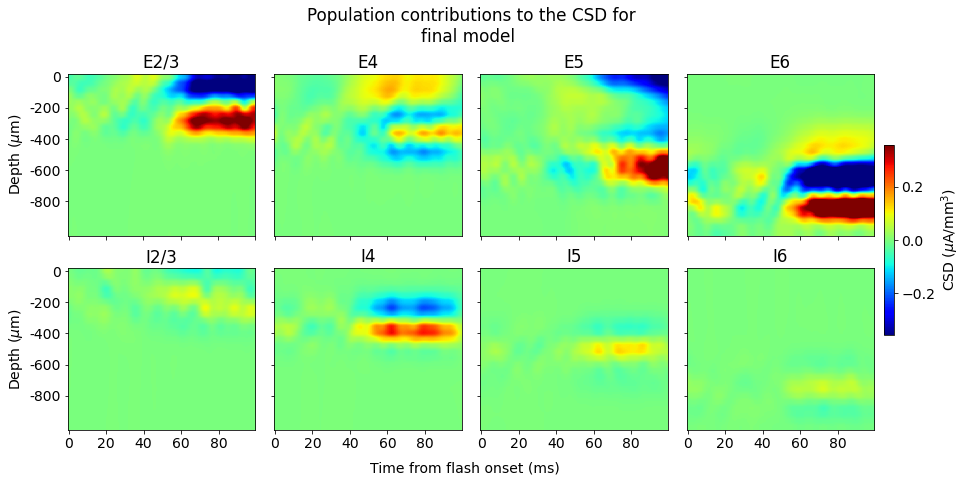

In [25]:
scale_to_uA = 1E-3

for sim_name, csd_sim_layerpops in sorted(csd_sims_layerpops.items()):
    #if '12' not in sim_name:
    #    continue
    
    fig, axes = plt.subplots(nrows=2,ncols=4,figsize=(14,6.6), sharex = True, sharey = True)

    fig.subplots_adjust(wspace = 0.1, left = 0.1, right = 0.9, bottom = 0.1, top = 0.85)
    ipop = 0
    for pop_name, csd_sim_layerpop in csd_sim_layerpops.items():
        if pop_name == '1i':
            continue
        irow = ipop // 4
        icol = ipop % 4
        csd_sim_layerpop_trial_avg = np.mean(csd_sim_layerpop, axis = 0)*scale_to_uA
        csd_plot = csd_sim_layerpop_trial_avg[:, tstim_onset_sim:tstim_onset_sim+100]
        
        im = axes[irow,icol].imshow(csd_plot, cmap = 'jet', aspect = 'auto', vmin = -cmap_range, vmax = cmap_range)
        
        axes[irow,icol].set_title(pop_name_labels[pop_name])
        
        ipop += 1     

    axes[0,0].set_yticks(depth_ticks_sim)
    axes[0,0].set_yticklabels(depth_ticklabels_sim)

    axes[0,0].set_ylabel('Depth ($\mu$m)')
    axes[1,0].set_ylabel('Depth ($\mu$m)')
    
    axes[0,0].set_xticks(time_ticks_sim)
    axes[0,0].set_xticklabels(time_ticklabels_sim)
    
    cbaxes = fig.add_axes([0.91, 0.3, 0.01, 0.4])
    cb = fig.colorbar(im, ax = axes[-1,-1], cax = cbaxes)
    cb.set_label('CSD ($\mu$A/mm$^3$)')
    
    fig.suptitle('Population contributions to the CSD for\n'+sims_labels[sim_name].lower().split('\n')[0], y = 0.99)
    
    plt.figtext(s = 'Time from flash onset (ms)', x = 0.4, y = 0.01)
    
    title = sims_labels[sim_name]
    #fig.suptitle(title, y = 0.9)
    
    fig_name = 'csd_pops_'+sim_name+'.png'
    
    savepath = os.path.join(fig_dir, fig_name)
    
    #fig.savefig(savepath, facecolor = 'w')

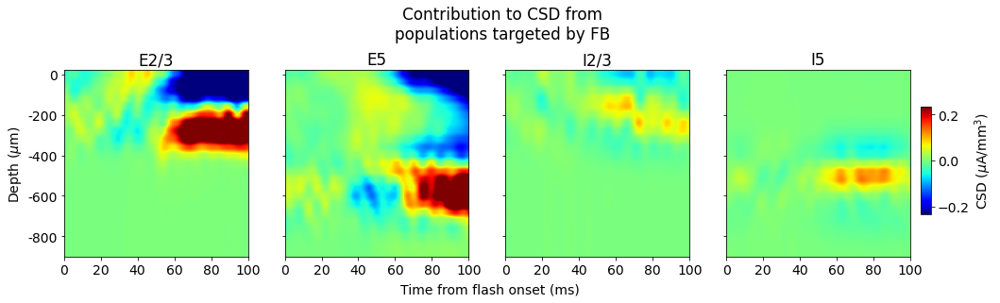

In [26]:


for sim_name, csd_sim_layerpops in sorted(csd_sims_layerpops.items()):
    #if '12' not in sim_name:
    #    continue
    
    fig, axes = plt.subplots(nrows=1,ncols=4,figsize=(15,4.5), sharex = True, sharey = True)

    fig.subplots_adjust(wspace = 0.2, hspace = 0.25, left = 0.07, right = 0.9, bottom = 0.16, top = 0.77)
    ipop = 0
    for pop_name, csd_sim_layerpop in csd_sim_layerpops.items():
        if pop_name not in ['23e', '5e', '23i', '5i']:
            continue
        icol = ipop % 4
        ax = axes[icol]
        csd_sim_layerpop_trial_avg = np.mean(csd_sim_layerpop, axis = 0)*scale_to_uA
        csd_plot = csd_sim_layerpop_trial_avg[:nchan_sim, tstim_onset_sim:tstim_onset_sim+101]
        
        if ipop == 0:
            cmap_range = np.abs(csd_plot).max()/2
        
        im = ax.imshow(csd_plot, cmap = 'jet', aspect = 'auto', vmin = -cmap_range, vmax = cmap_range)
        
        ax.set_title(pop_name_labels[pop_name])
        
        ipop += 1     

    axes[0].set_yticks(depth_ticks_sim)
    axes[0].set_yticklabels(depth_ticklabels_sim)
    
    axes[0].set_xlim([0,100])

    axes[0].set_ylabel('Depth ($\mu$m)')
    #axes[1,0].set_ylabel('Depth ($\mu$m)')
    
    axes[0].set_xticks(time_ticks_sim)
    axes[0].set_xticklabels(time_ticklabels_sim)
    
    cbaxes = fig.add_axes([0.91, 0.3, 0.01, 0.35])
    cb = fig.colorbar(im, ax = axes[-1], cax = cbaxes)
    cb.set_label('CSD ($\mu$A/mm$^3$)')
    
    plt.figtext(s = 'Time from flash onset (ms)', x = 0.4, y = 0.04)
    
    title = 'Contribution to CSD from\npopulations targeted by FB'
    fig.suptitle(title, y = 0.98)
    
    
    fig_name = 'csd_targeted_pops_'+sim_name+'.png'
    
    savepath = os.path.join(fig_dir, fig_name)
    
    #fig.savefig(savepath, facecolor = 'w')

In [27]:
fig_dir

'Figures/Supplementary_figures'

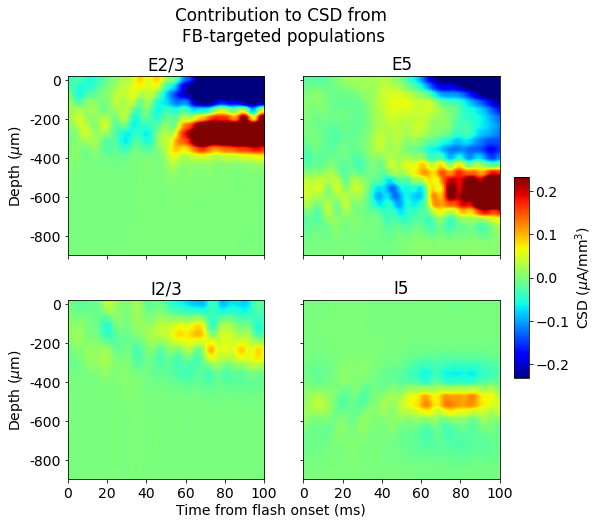

In [28]:


for sim_name, csd_sim_layerpops in sorted(csd_sims_layerpops.items()):
    #if '12' not in sim_name:
    #    continue
    
    fig, axes = plt.subplots(nrows=2,ncols=2,figsize=(10,8), sharex = True, sharey = True)

    fig.subplots_adjust(wspace = 0.2, hspace = 0.25, left = 0.2, right = 0.8, bottom = 0.15, top = 0.85)
    ipop = 0
    for pop_name, csd_sim_layerpop in csd_sim_layerpops.items():
        if pop_name not in ['23e', '5e', '23i', '5i']:
            continue
        irow = ipop // 2
        icol = ipop % 2
        csd_sim_layerpop_trial_avg = np.mean(csd_sim_layerpop, axis = 0)*scale_to_uA
        csd_plot = csd_sim_layerpop_trial_avg[:nchan_sim, tstim_onset_sim:tstim_onset_sim+101]
        
        if ipop == 0:
            cmap_range = np.abs(csd_plot).max()/2
        
        im = axes[irow,icol].imshow(csd_plot, cmap = 'jet', aspect = 'auto', vmin = -cmap_range, vmax = cmap_range)
        
        axes[irow,icol].set_title(pop_name_labels[pop_name])
        
        ipop += 1     

    axes[0,0].set_yticks(depth_ticks_sim)
    axes[0,0].set_yticklabels(depth_ticklabels_sim)
    
    axes[0,0].set_xlim([0,100])

    axes[0,0].set_ylabel('Depth ($\mu$m)')
    axes[1,0].set_ylabel('Depth ($\mu$m)')
    
    axes[0,0].set_xticks(time_ticks_sim)
    axes[0,0].set_xticklabels(time_ticklabels_sim)
    
    cbaxes = fig.add_axes([0.82, 0.325, 0.02, 0.35])
    cb = fig.colorbar(im, ax = axes[-1,-1], cax = cbaxes)
    cb.set_label('CSD ($\mu$A/mm$^3$)')
    
    plt.figtext(s = 'Time from flash onset (ms)', x = 0.35, y = 0.09)
    
    title = 'Contribution to CSD from \nFB-targeted populations'
    fig.suptitle(title, y = 0.97)
    
    
    fig_name = 'csd_targeted_pops_'+sim_name+'.png'
    
    savepath = os.path.join(fig_dir, fig_name)
    
    #fig.savefig(savepath, facecolor = 'w')

### LFP and CSD

In [29]:

#filename = 'cortical_depth_'+str(session_id)+'.csv'
#loadpath = os.path.join(exp_meta_data_dir, 'probes_cortical_depths', filename)
sessions_df_depth = dict()
loadpaths = sorted(glob(os.path.join(exp_meta_data_dir, 'probes_cortical_depths', '*')))
for loadpath in loadpaths:
    session_id = loadpath.split('/')[-1].split('.')[0].split('_')[-1]
    df_depth = pd.read_csv(loadpath, sep=' ')
    df_depth = df_depth.set_index('id')
    sessions_df_depth[session_id] = df_depth


In [30]:
session_id = list(sessions_df_depth.keys())[1]

channel_step_exp = 5
depth_ticks_exp = np.arange(0, len(channels_vert_pos), channel_step_exp)
depth_step_exp = channel_step_exp*np.diff(channels_vert_pos)[0]
depth_ticklabels_exp = np.arange(channels_vert_pos[0], channels_vert_pos[-1]+depth_step_exp, depth_step_exp) 


time_start_label_exp = 0
time_stop_label_exp = 100
time_step_label_exp = 20
time_ticklabels_exp = np.arange(time_start_label_exp, time_stop_label_exp+time_step_label_exp, time_step_label_exp)
sf = 1250
time_tick_step_exp = int(time_step_label_exp*sf/1E3)
time_ticks_exp = np.arange(0, sessions_csd_trial_avg[session_id].shape[-1]+time_tick_step_exp, time_tick_step_exp)

# Align by landmarks

#### Expand # of channels by interpolation before alignment

In [31]:
sessions_csd_trial_avg_interp = dict()
sessions_sinks_trial_avg_interp = dict()
sessions_sources_trial_avg_interp = dict()

#sp_len = 30; 
t_len = 100
factor = 4 # scaling factor to increase # channels
#sp_len = 30; t_len = 1500
for i_sess, session_id in enumerate(sessions_csd_trial_avg.keys()):
    csd_trial_avg = sessions_csd_trial_avg[session_id]
    
    sp_len = factor*csd_trial_avg.shape[0]
    #t_len = 4*csd_trial_avg.shape[0]
    
    sinks_interp = np.zeros((sp_len, t_len))
    sources_interp = np.zeros((sp_len, t_len))
    
    z = csd_trial_avg
    x = np.linspace(0., 1., z.shape[1], endpoint=True)
    y = np.linspace(0., 1., z.shape[0], endpoint=True)
    #xx, yy = np.meshgrid(x, y)
    f = interpolate.interp2d(x, y, z, kind='cubic')

    x_new = np.linspace(0., 1., t_len, endpoint=True)
    y_new = np.linspace(0., 1., sp_len, endpoint=True)
    csd_interp = f(x_new, y_new)
    
    mask_sinks = csd_interp < 0
    mask_sources = csd_interp > 0
    
    sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
    sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])
    
    
    sessions_csd_trial_avg_interp[session_id] = csd_interp#/np.abs(csd_interp).max()
    sessions_sinks_trial_avg_interp[session_id] = sinks_interp/sinks_interp.sum()
    sessions_sources_trial_avg_interp[session_id] = sources_interp/sources_interp.sum()

In [32]:
landmarks_chan_nr = dict()
landmarks_chan_nr['L23_sink'] = []
landmarks_chan_nr['L4_sink'] = []
landmarks_chan_nr['L5_sink'] = []

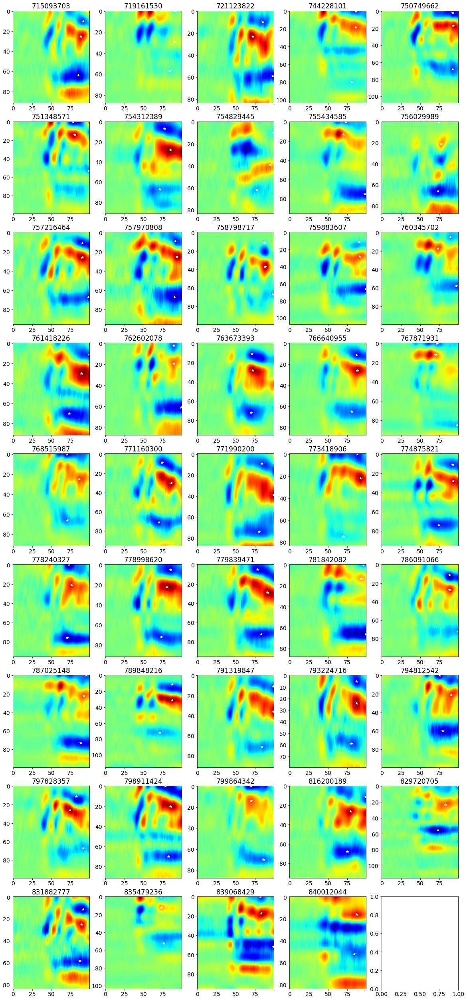

In [33]:
fig, axes = plt.subplots(nrows = 9, ncols = 5, figsize = (20,45))

sessions_sinks_trial_avg = dict()
sessions_sources_trial_avg = dict()

for isess, session_id in enumerate(sessions_csd_trial_avg_interp.keys()):
    irow = isess // 5
    icol = isess % 5
    csd_plot = sessions_csd_trial_avg_interp[session_id]
    
    sinks_isess = np.zeros_like(csd_plot)
    sources_isess = np.zeros_like(sinks_isess)
    
    mask_sinks = csd_plot < 0
    mask_sources = csd_plot > 0
    
    sinks_isess[mask_sinks] = np.abs(csd_plot[mask_sinks])
    sources_isess[mask_sources] = csd_plot[mask_sources]
    
    sessions_sinks_trial_avg[session_id] = sinks_isess
    sessions_sources_trial_avg[session_id] = sources_isess
    
    cmap_range = np.abs(csd_plot).max()
    
    ax = axes[irow,icol]
    ax.imshow(csd_plot, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
    
    peak_L23_sink = csd_plot[0:3*factor,70:].min()
    ichan_L23_sink, itime_L23_sink = np.where(csd_plot == peak_L23_sink)
    
    landmarks_chan_nr['L23_sink'].append(ichan_L23_sink[0])
    
    ax.plot(itime_L23_sink[0], ichan_L23_sink[0], '*', color = 'w')
    
    peak_L4_sink = csd_plot[3*factor:10*factor,70:].max()
    ichan_L4_sink, itime_L4_sink = np.where(csd_plot == peak_L4_sink)
    
    landmarks_chan_nr['L4_sink'].append(ichan_L4_sink[0])
    
    ax.plot(itime_L4_sink[0], ichan_L4_sink[0], '*', color = 'w')
    
    peak_L5_sink = csd_plot[13*factor:,70:].min()
    ichan_L5_sink, itime_L5_sink = np.where(csd_plot == peak_L5_sink)
    
    landmarks_chan_nr['L5_sink'].append(ichan_L5_sink[0])
    
    ax.plot(itime_L5_sink[0], ichan_L5_sink[0], '*', color = 'w')
    
    ax.set_title(session_id)
    
landmarks_chan_nr['L23_sink'] = np.array(landmarks_chan_nr['L23_sink'])
landmarks_chan_nr['L4_sink'] = np.array(landmarks_chan_nr['L4_sink'])
landmarks_chan_nr['L5_sink'] = np.array(landmarks_chan_nr['L5_sink'])
    

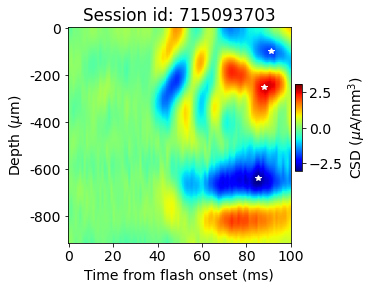

In [34]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (5,4))

sessions_sinks_trial_avg = dict()
sessions_sources_trial_avg = dict()

for isess, session_id in enumerate(list(sessions_csd_trial_avg_interp.keys())[:1]):
    #irow = isess // 5
    #icol = isess % 5
    csd_plot = sessions_csd_trial_avg_interp[session_id]
    
    sinks_isess = np.zeros_like(csd_plot)
    sources_isess = np.zeros_like(sinks_isess)
    
    mask_sinks = csd_plot < 0
    mask_sources = csd_plot > 0
    
    sinks_isess[mask_sinks] = np.abs(csd_plot[mask_sinks])
    sources_isess[mask_sources] = csd_plot[mask_sources]
    
    sessions_sinks_trial_avg[session_id] = sinks_isess
    sessions_sources_trial_avg[session_id] = sources_isess
    
    cmap_range = np.abs(csd_plot).max()
    ax = axes#[irow,icol]
    im = ax.imshow(csd_plot, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
    
    peak_L23_sink = csd_plot[0:3*4,70:].min()
    ichan_L23_sink, itime_L23_sink = np.where(csd_plot == peak_L23_sink)
    
    #landmarks_chan_nr_after_align['L23_sink'].append(ichan_L23_sink[0])
    
    ax.plot(itime_L23_sink[0], ichan_L23_sink[0], '*', color = 'w')
    
    peak_L4_sink = csd_plot[3*4:10*4,70:].max()
    ichan_L4_sink, itime_L4_sink = np.where(csd_plot == peak_L4_sink)
    
    #landmarks_chan_nr_after_align['L4_sink'].append(ichan_L4_sink[0])
    
    ax.plot(itime_L4_sink[0], ichan_L4_sink[0], '*', color = 'w')
    
    peak_L5_sink = csd_plot[13*4:,70:].min()
    ichan_L5_sink, itime_L5_sink = np.where(csd_plot == peak_L5_sink)
    
    #landmarks_chan_nr_after_align['L5_sink'].append(ichan_L5_sink[0])
    
    ax.plot(itime_L5_sink[0], ichan_L5_sink[0], '*', color = 'w')
    
    ax.set_title('Session id: '+session_id)
    
ax.set_xticks(np.arange(0,120,20))
ax.set_yticks(np.arange(0,100,20))
ax.set_yticklabels(-np.arange(0,1000,200))
ax.set_ylabel('Depth ($\mu$m)')

cbaxes = fig.add_axes([0.81,0.4, 0.02, 0.3])
cb = fig.colorbar(im, ax = ax, cax = cbaxes)
cb.set_label('CSD ($\mu$A/mm$^3$)', fontsize = 14)

ax.set_xlabel('Time from flash onset (ms)')

fig.subplots_adjust(left = 0.18, right = 0.8, bottom = 0.15, top = 0.9)

fig_name = 'landmarks_csd_'+session_id+'.png'

savepath = os.path.join(fig_dir, fig_name)

#fig.savefig(savepath, facecolor = 'w') 

In [35]:
for lm_name in landmarks_chan_nr.keys():
    print(np.abs(np.median(landmarks_chan_nr[lm_name])-landmarks_chan_nr[lm_name]))

[5. 5. 5. 5. 3. 5. 2. 5. 5. 5. 6. 4. 6. 6. 0. 6. 3. 6. 6. 5. 5. 4. 4. 5.
 6. 5. 0. 0. 5. 6. 5. 6. 6. 0. 5. 6. 5. 5. 6. 5. 6. 5. 5. 5.]
[ 0.5  4.5  1.5  6.5  7.5 10.5  3.5 14.5 11.5  3.5  1.5  0.5 12.5  3.5
  7.5  5.5  5.5  3.5  1.5 12.5  0.5  5.5 14.5  2.5  3.5  3.5  2.5  4.5
 11.5  2.5  2.5  6.5 11.5  0.5  3.5  1.5  4.5 10.5  1.5  1.5  0.5 12.5
  7.5  8.5]
[ 3. 10.  8. 13.  1. 14.  0.  5.  8.  1.  0.  0.  0.  1.  9.  3.  6.  5.
  2. 18.  1.  4.  7.  8.  7.  9.  5.  5.  1.  5.  6.  5.  4.  8.  7.  0.
  3.  3.  1. 12.  9. 15. 15. 15.]


#### Convert landmark channel numbers to array and find median

In [37]:
lms_chan_nrs = np.array(list(landmarks_chan_nr.values()))
lms_median_chans = np.median(lms_chan_nrs, axis = 1)

#### Count number of channels in each recorded animal

In [39]:
sessions_nchans = []
for isess, session_id in enumerate(sessions_csd_trial_avg_interp.keys()):
    csd_plot = sessions_csd_trial_avg_interp[session_id]
    sessions_nchans.append(csd_plot.shape[0])
sessions_nchans = np.array(sessions_nchans)

### Perform alignment

In [41]:
sessions_csd_lm_aligned = dict()
for i_sess, session_id in enumerate(list(sessions_csd_trial_avg_interp.keys())):
    print(session_id)
    #for imark, mark_name in enumerate(landmarks_chan_nr.keys()):
    
    #try:
    chans_lm_anim = lms_chan_nrs[:,i_sess]
    print(chans_lm_anim)

    for imark in range(len(chans_lm_anim)+1):
        if imark == 0:
            if chans_lm_anim[0] < 2:
                csd_btween_lm = sessions_csd_trial_avg_interp[session_id][:2]
            else:
                csd_btween_lm = sessions_csd_trial_avg_interp[session_id][:chans_lm_anim[imark]]
            chan_end_interp = int(lms_median_chans[imark])
            #chan_end_interp = 2
        elif imark < len(chans_lm_anim):
            csd_btween_lm = sessions_csd_trial_avg_interp[session_id][chans_lm_anim[imark-1]:chans_lm_anim[imark]]
            chan_end_interp = int(lms_median_chans[imark]-lms_median_chans[imark-1])
        else:
            csd_btween_lm = sessions_csd_trial_avg_interp[session_id][chans_lm_anim[imark-1]:]
            chan_end_interp = int(np.median(sessions_nchans)-lms_median_chans[imark-1])



        print(chan_end_interp)
        z = csd_btween_lm
        x = np.linspace(0., 1., z.shape[1], endpoint=True)
        y = np.linspace(0., 1., z.shape[0], endpoint=True)
        #xx, yy = np.meshgrid(x, y)
        f = interpolate.interp2d(x, y, z, kind='linear')#, ky = 2)

        x_new = np.linspace(0., 1., csd_btween_lm.shape[1], endpoint=True)

        y_new = np.linspace(0., 1., chan_end_interp, endpoint=True)
        csd_interp_temp = f(x_new, y_new)

        if imark==0:
            csd_interp_total = csd_interp_temp
        else:
            csd_interp_total = np.concatenate([csd_interp_total, csd_interp_temp], axis = 0)

    peak_L23_sink = csd_interp_total[0:3*factor,70:].min()
    ichan_L23_sink, itime_L23_sink = np.where(csd_interp_total == peak_L23_sink)

    peak_L4_sink = csd_interp_total[3*factor:10*factor,70].max()
    ichan_L4_sink, itime_L4_sink = np.where(csd_interp_total == peak_L4_sink)

    peak_L5_sink = csd_interp_total[13*factor:,70:].min()
    ichan_L5_sink, itime_L5_sink = np.where(csd_interp_total == peak_L5_sink)

    print(ichan_L23_sink, ichan_L4_sink, ichan_L5_sink)

    sessions_csd_lm_aligned[session_id] = csd_interp_total

    print('\n\n')
   # except:
   #     print(session_id,'---------------------------\n\n')
   #     continue

715093703
[10 25 64]
5
19
42
29
[5] [16] [66]



719161530
[ 0 29 57]
5
19
42
29
[0 5] [12] [52]



721123822
[10 23 59]
5
19
42
29
[5] [23] [66]



744228101
[ 0 18 80]
5
19
42
29
[0 5] [20] [66]



750749662
[ 2 17 68]
5
19
42
29
[5] [24] [66]



751348571
[ 0 14 53]
5
19
42
29
[0 5] [23] [66]



754312389
[ 7 28 67]
5
19
42
29
[5] [22] [66]



754829445
[10 39 62]
5
19
42
29
[11] [39] [66]



755434585
[ 0 13 75]
5
19
42
29
[0 5] [24] [66]



756029989
[ 0 21 66]
5
19
42
29
[0 5] [21] [66]



757216464
[11 26 67]
5
19
42
29
[8] [16] [66]



757970808
[ 9 25 67]
5
19
42
29
[5] [13] [66]



758798717
[11 37 67]
5
19
42
29
[11] [19] [66]



759883607
[11 28 66]
5
19
42
29
[10] [25] [66]



760345702
[ 5 17 58]
5
19
42
29
[5] [24] [66]



761418226
[11 30 70]
5
19
42
29
[7] [12] [66]



762602078
[ 2 19 61]
5
19
42
29
[5] [35] [66]



763673393
[11 28 72]
5
19
42
29
[9] [23] [66]



766640955
[11 26 65]
5
19
42
29
[5] [18] [66]



767871931
[ 0 12 85]
5
19
42
29
[0 5] [24] [66]



76851

## Plot CSD before and after alignment

In [44]:
plt.rcParams.update({'figure.max_open_warning': 100})

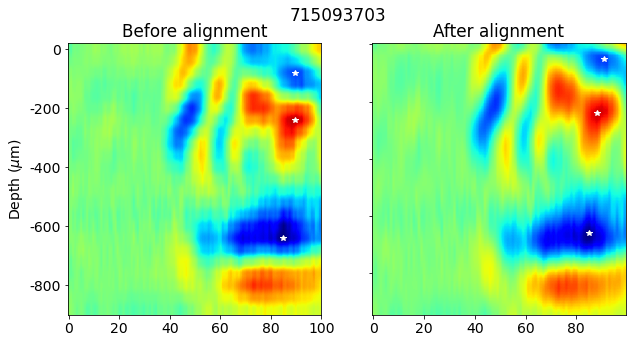

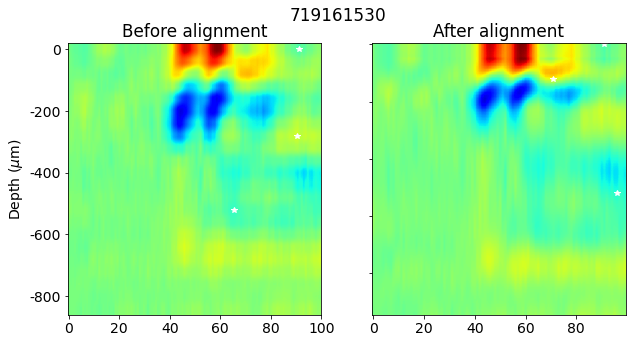

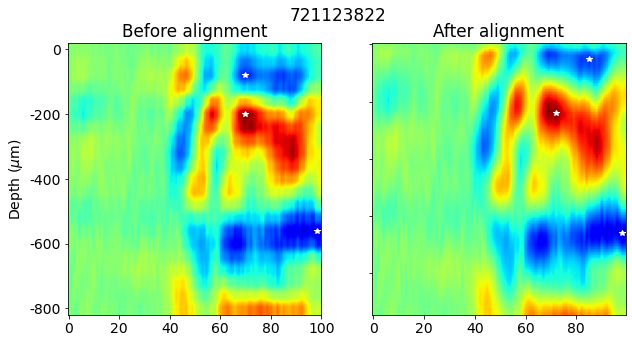

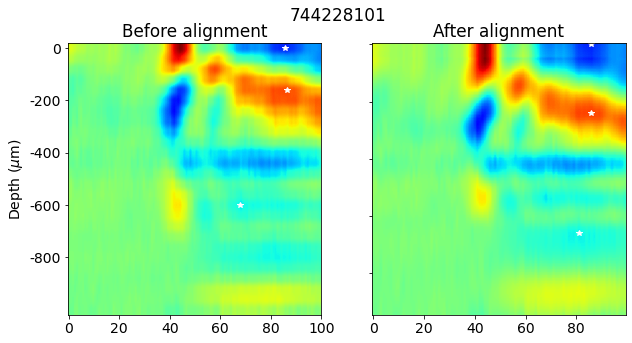

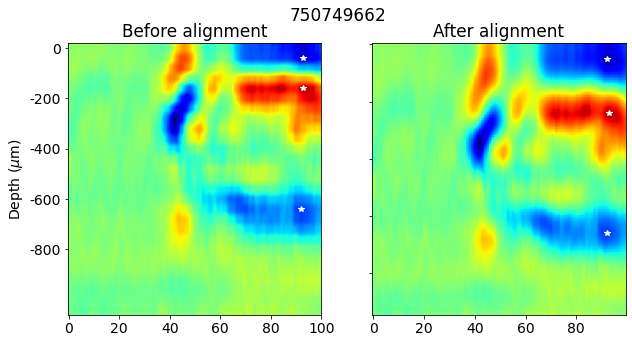

...

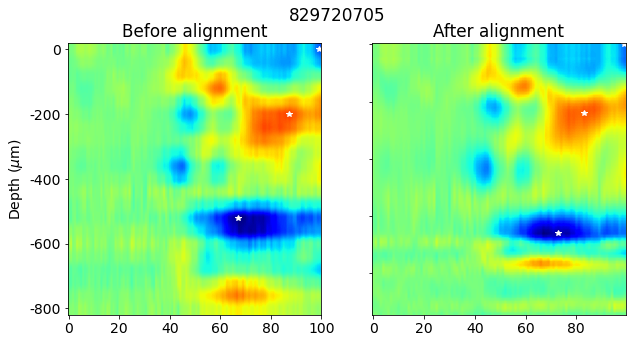

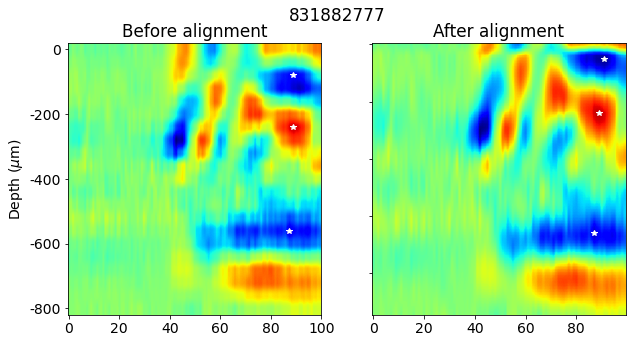

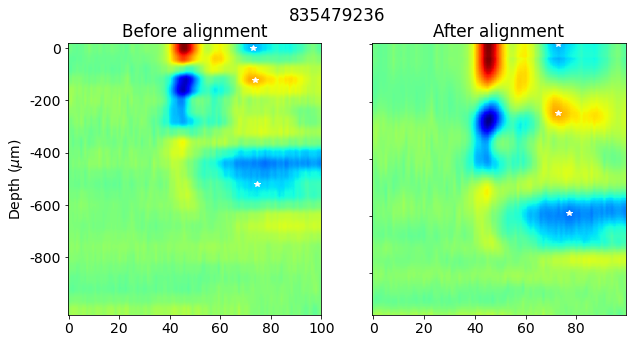

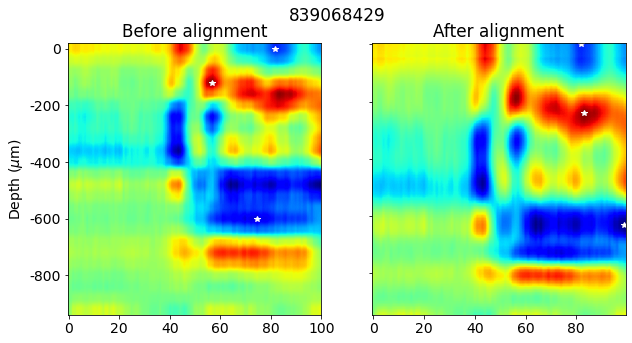

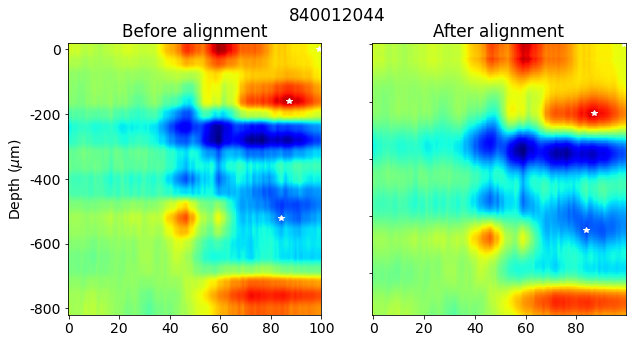

In [45]:
for session_id in sessions_csd_lm_aligned.keys():
    
    fig, axes = plt.subplots(ncols = 2, figsize = (10, 5))
    
    ax = axes[0]
    
    csd_orig = sessions_csd_trial_avg_short[session_id]
    
    cmap_range = np.abs(csd_orig).max()
    ax.imshow(csd_orig, cmap = 'jet', aspect = 'auto', vmin = -cmap_range, vmax = cmap_range)
    
    peak_L23_sink = csd_orig[0:3,70:].min()
    ichan_L23_sink, itime_L23_sink = np.where(csd_orig == peak_L23_sink)
        
    ax.plot(itime_L23_sink[0], ichan_L23_sink[0], '*', color = 'w')
    
    peak_L4_sink = csd_orig[3:10,70:].max()
    ichan_L4_sink, itime_L4_sink = np.where(csd_orig == peak_L4_sink)
        
    ax.plot(itime_L4_sink[0], ichan_L4_sink[0], '*', color = 'w')
    
    peak_L5_sink = csd_orig[13:,70:].min()
    ichan_L5_sink, itime_L5_sink = np.where(csd_orig == peak_L5_sink)
        
    ax.plot(itime_L5_sink[0], ichan_L5_sink[0], '*', color = 'w')
    
    ax.set_yticks(np.arange(0,25,5))
    ax.set_yticklabels(-np.arange(0,860,200))
    ax.set_ylabel('Depth ($\mu$m)')
    
    ax.set_xticks(np.arange(0,125+25,25))
    ax.set_xticklabels(np.arange(0,100+20,20))
    
    ax.set_title('Before alignment')
    
    
    csd_lm_aligned = sessions_csd_lm_aligned[session_id]
    
    ax = axes[1]
    
    cmap_range = np.abs(csd_lm_aligned).max()
    ax.imshow(csd_lm_aligned, cmap = 'jet', aspect = 'auto', vmin = -cmap_range, vmax = cmap_range)
    
    peak_L23_sink = csd_lm_aligned[0:3*4,70:].min()
    ichan_L23_sink, itime_L23_sink = np.where(csd_lm_aligned == peak_L23_sink)
    
    ax.plot(itime_L23_sink[0], ichan_L23_sink[0], '*', color = 'w')
    
    
    peak_L4_sink = csd_lm_aligned[3*4:10*4,70:].max()
    ichan_L4_sink, itime_L4_sink = np.where(csd_lm_aligned == peak_L4_sink)
        
    ax.plot(itime_L4_sink[0], ichan_L4_sink[0], '*', color = 'w')
    
    
    peak_L5_sink = csd_lm_aligned[13*4:,70:].min()
    ichan_L5_sink, itime_L5_sink = np.where(csd_lm_aligned == peak_L5_sink)
        
    ax.plot(itime_L5_sink[0], ichan_L5_sink[0], '*', color = 'w')
    
    
    fig.suptitle(session_id)
    
    ax.set_title('After alignment')
    
    ax.set_yticklabels([])
    
    fig_name = 'csd_before_and_after_alignment'


### Go back to standard number of measurement points along depth

In [83]:
# Downsample
sessions_csd_lm_aligned_interp_ds = dict()
sessions_sinks_lm_aligned_interp = dict()
sessions_sources_lm_aligned_interp = dict()

sp_len = 30; t_len = 100
for session_id in sessions_csd_lm_aligned.keys():
    csd_lm_aligned_orig = sessions_csd_lm_aligned[session_id]
    
    sinks_interp = np.zeros((sp_len, t_len))
    sources_interp = np.zeros((sp_len, t_len))
        
    z = csd_lm_aligned_orig
    x = np.linspace(0., 1., z.shape[1], endpoint=True)
    y = np.linspace(0., 1., z.shape[0], endpoint=True)
    #xx, yy = np.meshgrid(x, y)
    f = interpolate.interp2d(x, y, z, kind='cubic')#, ky = 2)

    x_new = np.linspace(0., 1., t_len, endpoint=True)
    y_new = np.linspace(0., 1., sp_len, endpoint=True)
    csd_interp = f(x_new, y_new)
    
    mask_sinks = csd_interp < 0
    mask_sources = csd_interp > 0
    
    sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
    sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])
    
    sessions_csd_lm_aligned_interp_ds[session_id] = csd_interp/np.abs(csd_interp).max()
    sessions_sinks_lm_aligned_interp[session_id] = sinks_interp/sinks_interp.sum()
    sessions_sources_lm_aligned_interp[session_id] = sources_interp/sources_interp.sum()

### Compare alignment by landmarks to alignment by histology

In [48]:
sessions_csd_trial_avg_interp = dict()
sessions_sinks_trial_avg_interp = dict()
sessions_sources_trial_avg_interp = dict()

sp_len = 30; t_len = 100
#sp_len = 30; t_len = 1500
for i_sess, session_id in enumerate(sessions_csd_trial_avg_short.keys()):
    csd_trial_avg = sessions_csd_trial_avg_short[session_id]
    
    sinks_interp = np.zeros((sp_len, t_len))
    sources_interp = np.zeros((sp_len, t_len))
    
    z = csd_trial_avg
    x = np.linspace(0., 1., z.shape[1], endpoint=True)
    y = np.linspace(0., 1., z.shape[0], endpoint=True)
    #xx, yy = np.meshgrid(x, y)
    f = interpolate.interp2d(x, y, z, kind='cubic')

    x_new = np.linspace(0., 1., t_len, endpoint=True)
    y_new = np.linspace(0., 1., sp_len, endpoint=True)
    csd_interp = f(x_new, y_new)
    
    mask_sinks = csd_interp < 0
    mask_sources = csd_interp > 0
    
    sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
    sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])
    
    
    sessions_csd_trial_avg_interp[session_id] = csd_interp#/np.abs(csd_interp).max()
    sessions_sinks_trial_avg_interp[session_id] = sinks_interp/sinks_interp.sum()
    sessions_sources_trial_avg_interp[session_id] = sources_interp/sources_interp.sum()

"diff = csd_plot_lm_aligned-csd_plot_hist_aligned\n\nax = axes[2]\nax.imshow(diff , aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)\nax.set_title('Difference')\n"

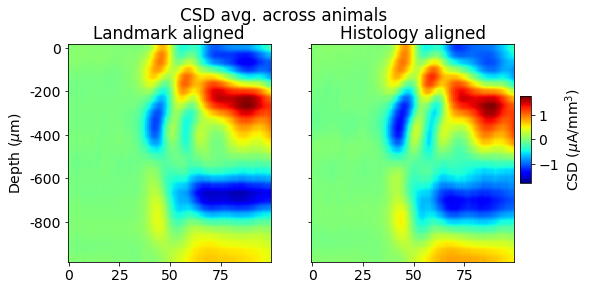

In [49]:


fig, axes = plt.subplots(ncols = 2, figsize = (8,4), sharey = True)

ax = axes[0]
csd_plot_lm_aligned = np.mean(np.array(list(sessions_csd_lm_aligned_interp_ds.values())), axis = 0)
cmap_range = np.abs(csd_plot_lm_aligned).max()
im = ax.imshow(csd_plot_lm_aligned, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
ax.set_ylabel('Depth ($\mu$m)')
ax.set_yticks(np.arange(0,30,6))
ax.set_yticklabels(-np.arange(0,1000,200))
ax.set_title('Landmark aligned')

ax = axes[1]
csd_plot_hist_aligned = np.mean(np.array(list(sessions_csd_trial_avg_interp.values())), axis = 0)
cmap_range = np.abs(csd_plot_hist_aligned).max()
ax.imshow(csd_plot_hist_aligned , aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
ax.set_title('Histology aligned')

cbaxes = fig.add_axes([0.91,0.4, 0.02, 0.3])
cb = fig.colorbar(im, ax = ax, cax = cbaxes)
cb.set_label('CSD ($\mu$A/mm$^3$)', fontsize = 14)

fig.suptitle('CSD avg. across animals', y = 1.01)

'''diff = csd_plot_lm_aligned-csd_plot_hist_aligned

ax = axes[2]
ax.imshow(diff , aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
ax.set_title('Difference')
'''


### Interpolate and normalize

#### Exp

In [50]:
sessions_csd_trial_avg_interp = dict()
sessions_sinks_trial_avg_interp = dict()
sessions_sources_trial_avg_interp = dict()

sp_len = 30; t_len = 100
#sp_len = 30; t_len = 1500
for i_sess, session_id in enumerate(sessions_csd_trial_avg_short.keys()):
    csd_trial_avg = sessions_csd_trial_avg_short[session_id]
    
    sinks_interp = np.zeros((sp_len, t_len))
    sources_interp = np.zeros((sp_len, t_len))
    
    z = csd_trial_avg
    x = np.linspace(0., 1., z.shape[1], endpoint=True)
    y = np.linspace(0., 1., z.shape[0], endpoint=True)
    #xx, yy = np.meshgrid(x, y)
    f = interpolate.interp2d(x, y, z, kind='cubic')

    x_new = np.linspace(0., 1., t_len, endpoint=True)
    y_new = np.linspace(0., 1., sp_len, endpoint=True)
    csd_interp = f(x_new, y_new)
    
    mask_sinks = csd_interp < 0
    mask_sources = csd_interp > 0
    
    sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
    sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])
    
    
    sessions_csd_trial_avg_interp[session_id] = csd_interp/np.abs(csd_interp).max()
    sessions_sinks_trial_avg_interp[session_id] = sinks_interp/sinks_interp.sum()
    sessions_sources_trial_avg_interp[session_id] = sources_interp/sources_interp.sum()

In [51]:
sessions_csd_all_trials_interp = dict()
sessions_sinks_all_trials_interp = dict()
sessions_sources_all_trials_interp = dict()

sp_len = 30; t_len = 100
for i_sess, session_id in enumerate(sessions_csd_all_trials_short.keys()):
    csd_all_trials_temp = np.zeros((sessions_csd_all_trials_short[session_id].shape[1], sp_len, t_len))
    sinks_all_trials_temp = np.zeros_like(csd_all_trials_temp)
    sources_all_trials_temp = np.zeros_like(csd_all_trials_temp)
    for itrial in range(sessions_csd_all_trials_short[session_id].shape[1]):
        csd_trial = sessions_csd_all_trials_short[session_id][:,itrial]

        sinks_interp = np.zeros((sp_len, t_len))
        sources_interp = np.zeros((sp_len, t_len))

        z = csd_trial
        x = np.linspace(0., 1., z.shape[1], endpoint=True)
        y = np.linspace(0., 1., z.shape[0], endpoint=True)
        #xx, yy = np.meshgrid(x, y)
        f = interpolate.interp2d(x, y, z, kind='cubic')

        x_new = np.linspace(0., 1., t_len, endpoint=True)
        y_new = np.linspace(0., 1., sp_len, endpoint=True)
        csd_interp = f(x_new, y_new)

        mask_sinks = csd_interp < 0
        mask_sources = csd_interp > 0

        sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
        sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])
        
        csd_all_trials_temp[itrial] = csd_interp
        sinks_all_trials_temp[itrial] = sinks_interp
        sources_all_trials_temp[itrial] = sources_interp


    sessions_csd_all_trials_interp[session_id] = csd_all_trials_temp#/np.abs(csd_all_trials_temp).max()
    sessions_sinks_all_trials_interp[session_id] = sinks_all_trials_temp/sinks_all_trials_temp.sum()
    sessions_sources_all_trials_interp[session_id] = sources_all_trials_temp/sources_all_trials_temp.sum()

## ICA on CSD

In [54]:
sessions_csd_ica = dict()
sessions_mixing_mat = dict()
n_components = 4

for session_id in sessions_csd_trial_avg_interp.keys():
    
    csd_trial_avg_interp = sessions_csd_trial_avg_interp[session_id]
    #csd_all_trials_interp = csd_all_trials_interp.reshape((csd_all_trials_interp.shape[0], sp_len*t_len))
    
    
    transformer = FastICA(n_components=n_components,
                     random_state=0,
                     whiten='unit-variance')
    X_transformed = transformer.fit_transform(csd_trial_avg_interp.T).T
    
    sessions_mixing_mat[session_id] = transformer.mixing_
    #print(X_transformed.shape)
    
    sessions_csd_ica[session_id] = X_transformed#.reshape(sp_len, t_len, n_components).T

/Users/atleeskelandrimehaug/opt/anaconda3/envs/gen_env/lib/python3.7/site-packages/sklearn/decomposition/_fastica.py:120: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


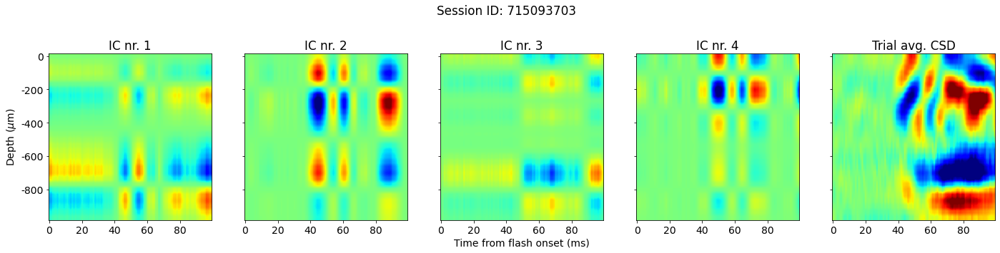

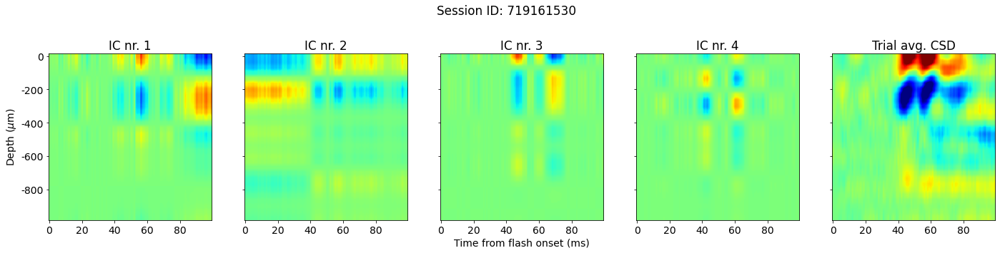

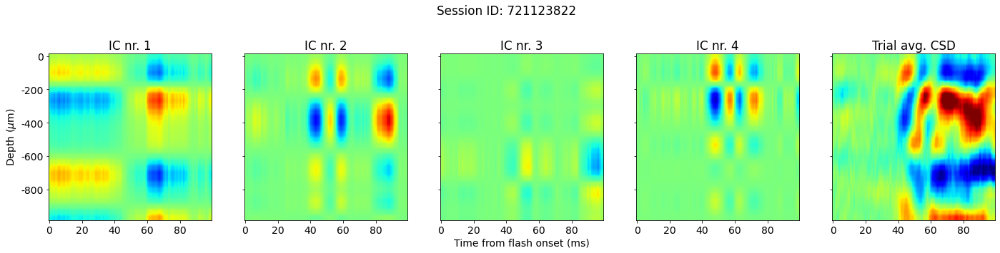

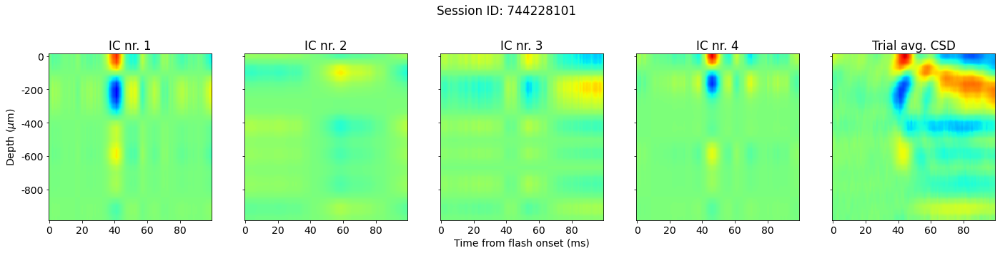

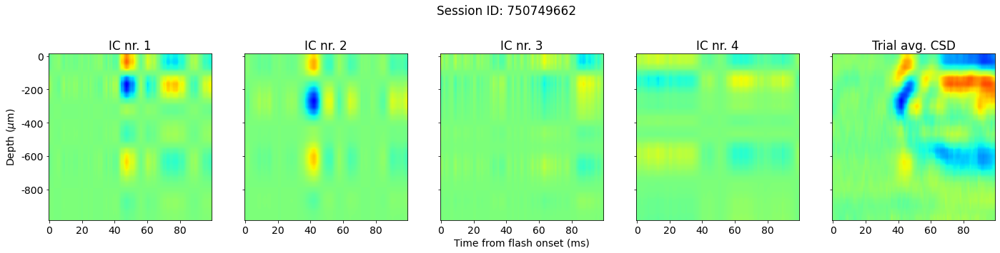

...

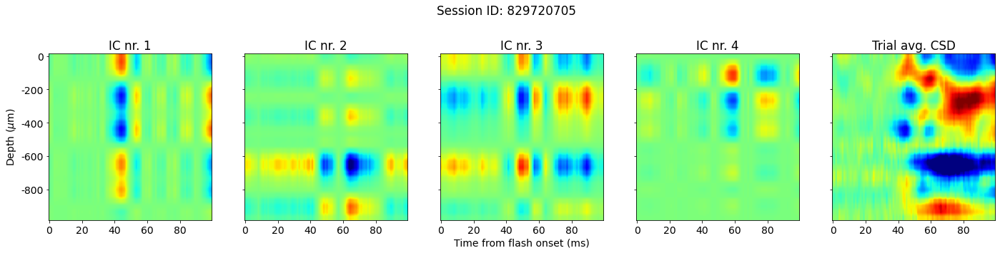

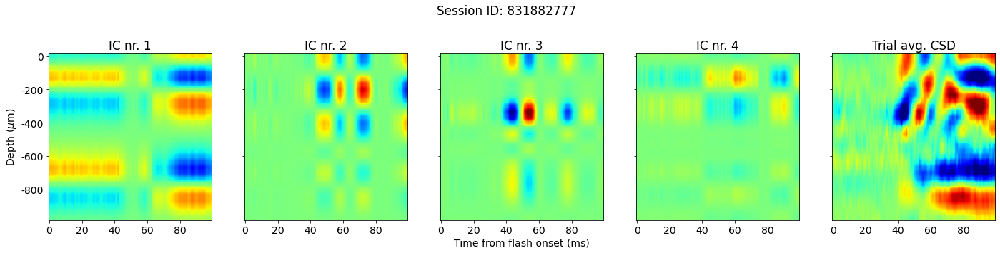

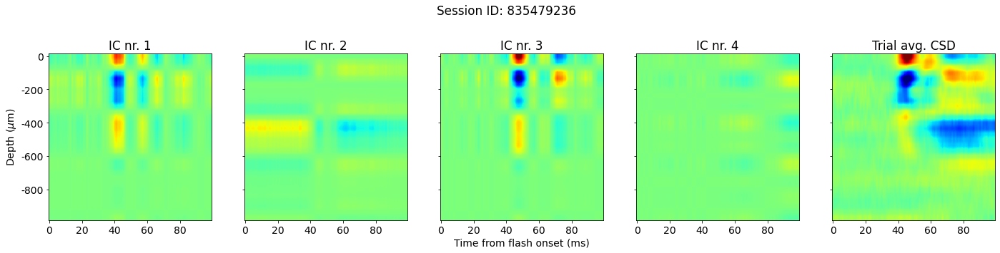

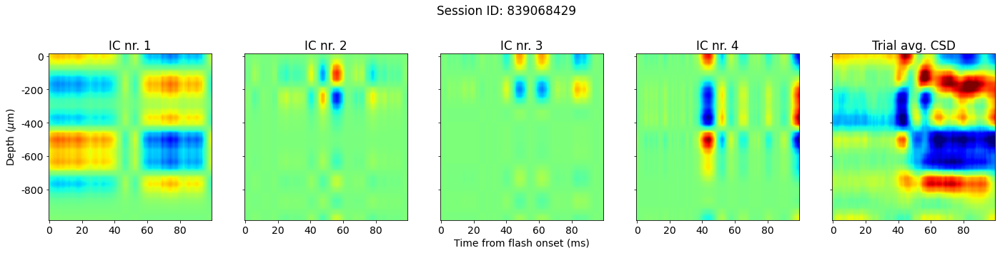

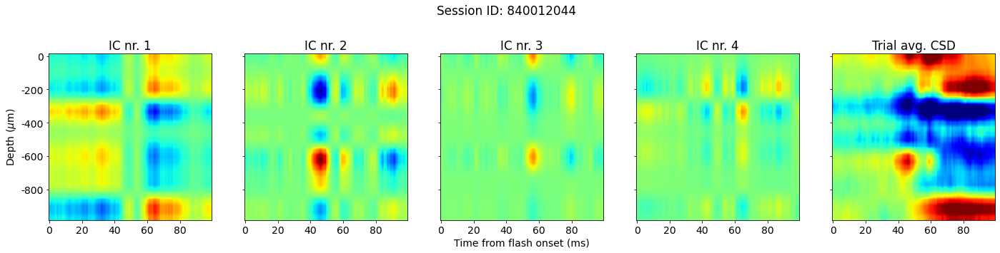

In [57]:


for session_id in sessions_mixing_mat.keys():
    mixing_mat = sessions_mixing_mat[session_id]
    X_transformed = sessions_csd_ica[session_id]

    fig, axes = plt.subplots(nrows = 1, ncols = n_components+1, figsize = (4*(n_components+1),5), sharey = True)
    
    fig.suptitle(session_id)

    
    for compNr in range(n_components):
        ax = axes[compNr]
        csd_ica_recon = np.outer(mixing_mat[:,compNr], X_transformed[compNr])

        if compNr == 0:
            cmap_range = np.abs(csd_ica_recon).max()*1.3
            csd_ica_recon_sum = csd_ica_recon
            ax.set_ylabel('Depth ($\mu$m)')
        else:
            csd_ica_recon_sum += csd_ica_recon
            
        if compNr == 2:
            ax.set_xlabel('Time from flash onset (ms)')
            
        ax.set_title('IC nr. '+str(compNr+1))

        ax.imshow(csd_ica_recon, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
        
    ax = axes[-1]
    #ax.imshow(csd_ica_recon_sum, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)

    csd_trial_avg_interp = sessions_csd_trial_avg_interp[session_id]
    #cmap_range = np.abs(csd_trial_avg_interp).max()
    ax.imshow(csd_trial_avg_interp, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
    
    
    ax.set_yticks(np.arange(0,30,6))
    ax.set_yticklabels(-np.arange(0,1000,200))
    
    ax.set_title('Trial avg. CSD')
    
    fig.suptitle('Session ID: '+str(session_id), x = 0.495, y = 0.99)
    
    fig.subplots_adjust(left = 0.05, right = 0.97, bottom = 0.15, top = 0.8)
    
    fig_name = 'ICA_decomp_'+str(n_components)+'comps_'+str(session_id)+'.png'
    
    savepath = os.path.join(fig_dir, 'ICA', 'exp', fig_name)
    
    #fig.savefig(savepath, facecolor = 'w')


### Do ICA on simulation CSD

In [59]:
sims_sinks = dict()
sims_sources = dict()

sims_csd_interp = dict()
sp_len = 30; t_len = 100
n_chans_in_cortex_sim = 21
for sim_name in csd_sims.keys():
    z = csd_sims[sim_name]['trial_avg'][:n_chans_in_cortex_sim,tstim_onset_sim:tstim_onset_sim+100]
    x = np.linspace(0., 1., z.shape[1], endpoint=True)
    y = np.linspace(0., 1., z.shape[0], endpoint=True)
    #xx, yy = np.meshgrid(x, y)
    f = interpolate.interp2d(x, y, z, kind='cubic')

    x_new = np.linspace(0., 1., t_len, endpoint=True)
    y_new = np.linspace(0., 1., sp_len, endpoint=True)
    csd_interp = f(x_new, y_new)

    sims_csd_interp[sim_name] = csd_interp

    mask_sinks = csd_interp < 0
    mask_sources = csd_interp > 0

    sinks_interp = np.zeros_like(csd_interp)
    sources_interp = np.zeros_like(csd_interp)

    sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
    sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])

    sims_sinks[sim_name] = sinks_interp / sinks_interp.sum()
    sims_sources[sim_name] = sources_interp / sources_interp.sum()


    sims_sinks_list = np.array(list(sims_sinks.values()))
    sims_sources_list = np.array(list(sims_sources.values()))

In [60]:
sims_csd_ica = dict()
sims_mixing_mat = dict()

n_components = 4
for sim_name in sims_csd_interp.keys():
    csd_sim_interp = sims_csd_interp[sim_name]
    
    transformer = FastICA(n_components=n_components,
                     random_state=0,
                     whiten='unit-variance')
    X_transformed = transformer.fit_transform(csd_sim_interp.T).T
    
    sims_mixing_mat[sim_name] = transformer.mixing_
    #print(X_transformed.shape)
    
    sims_csd_ica[sim_name] = X_transformed

/Users/atleeskelandrimehaug/opt/anaconda3/envs/gen_env/lib/python3.7/site-packages/sklearn/decomposition/_fastica.py:120: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


In [61]:
sims_csd_interp[sim_name].shape

(30, 100)

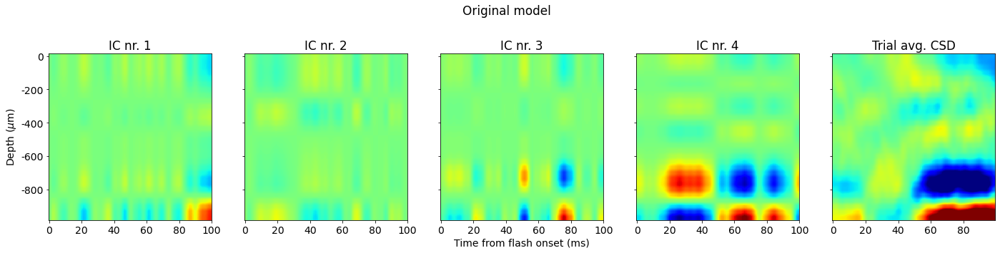

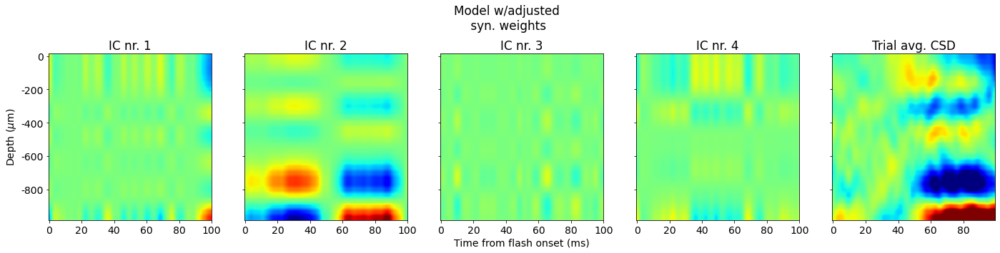

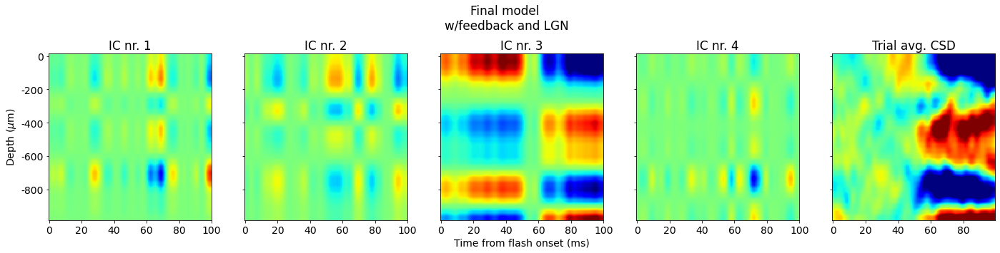

In [62]:
for sim_name in sims_mixing_mat.keys():
    mixing_mat = sims_mixing_mat[sim_name]
    X_transformed = sims_csd_ica[sim_name]

    fig, axes = plt.subplots(nrows = 1, ncols = n_components+1, figsize = (4*(n_components+1),5), sharey = True)
    
    for compNr in range(n_components):
        ax = axes[compNr]
        csd_ica_recon = np.outer(mixing_mat[:,compNr], X_transformed[compNr])

        if compNr == 0:
            cmap_range = np.abs(csd_ica_recon).max()*1.3
            csd_ica_recon_sum = csd_ica_recon
            ax.set_ylabel('Depth ($\mu$m)')
        else:
            csd_ica_recon_sum += csd_ica_recon
            
        if compNr == 2:
            ax.set_xlabel('Time from flash onset (ms)')

        ax.imshow(csd_ica_recon, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
        
        ax.set_xticks(np.arange(0,120,20))
                
        ax.set_title('IC nr. '+str(compNr+1))
        
    ax = axes[-1]
    #ax.imshow(csd_ica_recon_sum, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)

    csd_sim_interp = sims_csd_interp[sim_name]
    
    #if 'final' in sim_name:
    #    cmap_range = np.abs(csd_sim_interp).max()/2.2
    #else:
    #    cmap_range = np.abs(csd_sim_interp).max()/1.3
    ax.imshow(csd_sim_interp, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
    
    ax.set_yticks(np.arange(0,30,6))
    ax.set_yticklabels(-np.arange(0,1000,200))
    
    ax.set_title('Trial avg. CSD')
    
    fig.suptitle(sims_labels[sim_name], x = 0.495, y = 0.99)
    
    fig.subplots_adjust(left = 0.05, right = 0.97, bottom = 0.15, top = 0.8)
    
    fig_name = 'ICA_decomp_'+str(n_components)+'comps_'+sim_name+'.png'
    
    savepath = os.path.join(fig_dir, 'ICA', fig_name)
    
    #fig.savefig(savepath, facecolor = 'w')

## Interpolate for histology alignment

In [74]:
sessions_csd_trial_avg_interp = dict()
sessions_sinks_trial_avg_interp = dict()
sessions_sources_trial_avg_interp = dict()

sp_len = 30; t_len = 100
#sp_len = 30; t_len = 1500
for i_sess, session_id in enumerate(sessions_csd_trial_avg_short.keys()):
    csd_trial_avg = sessions_csd_trial_avg_short[session_id]
    
    sinks_interp = np.zeros((sp_len, t_len))
    sources_interp = np.zeros((sp_len, t_len))
    
    z = csd_trial_avg
    x = np.linspace(0., 1., z.shape[1], endpoint=True)
    y = np.linspace(0., 1., z.shape[0], endpoint=True)
    #xx, yy = np.meshgrid(x, y)
    f = interpolate.interp2d(x, y, z, kind='cubic')

    x_new = np.linspace(0., 1., t_len, endpoint=True)
    y_new = np.linspace(0., 1., sp_len, endpoint=True)
    csd_interp = f(x_new, y_new)
    
    mask_sinks = csd_interp < 0
    mask_sources = csd_interp > 0
    
    sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
    sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])
    
    
    sessions_csd_trial_avg_interp[session_id] = csd_interp/np.abs(csd_interp).max()
    sessions_sinks_trial_avg_interp[session_id] = sinks_interp/sinks_interp.sum()
    sessions_sources_trial_avg_interp[session_id] = sources_interp/sources_interp.sum()

### Plot trial avg. CSD from all animals (without interpolation)

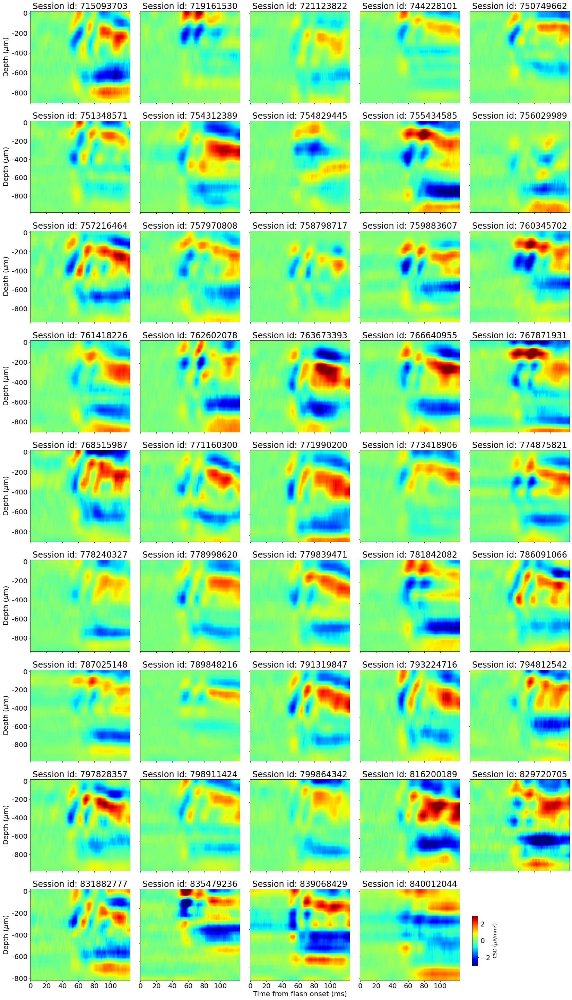

In [64]:
plt.rcParams.update({'font.size': 20})

fig, axes = plt.subplots(nrows = 9, ncols = 5, figsize = (23,40), sharex = True, sharey = False)

for isess, session_id in enumerate(sessions_csd_trial_avg_short.keys()):
    irow = isess // 5
    icol = isess % 5
    #csd_plot = sessions_csd_trial_avg_interp[session_id]
    csd_plot = sessions_csd_trial_avg_short[session_id]
    
    if isess == 0:
        cmap_range = np.abs(csd_plot).max()
    
    ax = axes[irow,icol]
    im = ax.imshow(csd_plot, aspect = 'auto', cmap = 'jet', vmin = -cmap_range, vmax = cmap_range)
        
    ax.set_title('Session id: '+session_id)
    
    if icol == 0:
        ax.set_yticks(np.arange(0,csd_plot.shape[0], 5))
        ax.set_yticklabels(-np.arange(0,1000,200))
        ax.set_ylabel('Depth ($\mu$m)')
    else:
        ax.set_yticks(np.arange(0,csd_plot.shape[0], 5))
        ax.set_yticklabels([])
    
ax.set_xticks(np.arange(0,120,20))
ax.set_xticklabels(np.arange(0,120,20))
fig.delaxes(axes[-1,-1])

axes[-1,2].set_xlabel('Time from flash onset (ms)')

fig.subplots_adjust(wspace = 0.1, left = 0.05, right = 0.99, bottom = 0.02, top = 0.99)

cbaxes = fig.add_axes([0.82, 0.035, 0.01, 0.05])
cb = fig.colorbar(im, ax = ax, cax = cbaxes)
cb.set_label('CSD ($\mu$A/mm$^3$)', fontsize = 14)

fig_name = 'csd_trial_avg_all_animals_no_interp.png'

savepath = os.path.join(fig_dir, fig_name)

#fig.savefig(savepath, facecolor = 'w')

plt.rcParams.update({'font.size': 14})

## PCA on trial averaged CSD

### Doing the PCA

#### On histology aligned CSD

In [75]:
csd_trial_avg_interp_grand = np.array(list(sessions_csd_trial_avg_interp.values()))
csd_trial_avg_interp_grand = csd_trial_avg_interp_grand.reshape(csd_trial_avg_interp_grand.shape[0], 
                        csd_trial_avg_interp_grand.shape[1]*csd_trial_avg_interp_grand.shape[2])

In [76]:
n_components = csd_trial_avg_interp_grand.shape[0]
pca = PCA(n_components=n_components)

pca.fit(csd_trial_avg_interp_grand.T)

PCA(n_components=44)

#### On landmark aligned CSD

In [119]:
# Downsample
sessions_csd_lm_aligned_interp_ds = dict()
sessions_sinks_lm_aligned_interp = dict()
sessions_sources_lm_aligned_interp = dict()

sp_len = 30; t_len = 100
for session_id in sessions_csd_lm_aligned.keys():
    csd_lm_aligned_orig = sessions_csd_lm_aligned[session_id]
    
    sinks_interp = np.zeros((sp_len, t_len))
    sources_interp = np.zeros((sp_len, t_len))
        
    z = csd_lm_aligned_orig
    x = np.linspace(0., 1., z.shape[1], endpoint=True)
    y = np.linspace(0., 1., z.shape[0], endpoint=True)
    #xx, yy = np.meshgrid(x, y)
    f = interpolate.interp2d(x, y, z, kind='cubic')#, ky = 2)

    x_new = np.linspace(0., 1., t_len, endpoint=True)
    y_new = np.linspace(0., 1., sp_len, endpoint=True)
    csd_interp = f(x_new, y_new)
    
    mask_sinks = csd_interp < 0
    mask_sources = csd_interp > 0
    
    sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
    sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])
    
    sessions_csd_lm_aligned_interp_ds[session_id] = csd_interp/np.abs(csd_interp).max()
    sessions_sinks_lm_aligned_interp[session_id] = sinks_interp/sinks_interp.sum()
    sessions_sources_lm_aligned_interp[session_id] = sources_interp/sources_interp.sum()

In [120]:
csd_lm_aligned_interp_grand = np.array(list(sessions_csd_lm_aligned_interp_ds.values()))
csd_lm_aligned_interp_grand = csd_lm_aligned_interp_grand.reshape(csd_lm_aligned_interp_grand.shape[0], 
                        csd_lm_aligned_interp_grand.shape[1]*csd_lm_aligned_interp_grand.shape[2])

In [121]:
n_components = csd_lm_aligned_interp_grand.shape[0]
pca = PCA(n_components=n_components)

pca.fit(csd_lm_aligned_interp_grand.T)

PCA(n_components=44)

In [122]:
print(pca.explained_variance_ratio_)

[6.10881160e-01 7.60361346e-02 5.02739529e-02 3.11205009e-02
 2.89930383e-02 2.68905906e-02 2.12039902e-02 1.75385740e-02
 1.65924283e-02 1.22255216e-02 1.07378054e-02 9.43696639e-03
 8.50981138e-03 8.05140627e-03 6.75308929e-03 5.99820222e-03
 5.44689517e-03 5.11406196e-03 4.71992676e-03 4.15980165e-03
 3.68888309e-03 3.57630676e-03 2.99449362e-03 2.65126982e-03
 2.57771021e-03 2.36834224e-03 2.25157607e-03 1.98083603e-03
 1.88188919e-03 1.80582514e-03 1.68442519e-03 1.48713427e-03
 1.30893601e-03 1.20747659e-03 1.12356217e-03 1.02976788e-03
 9.80658135e-04 9.53535488e-04 8.35934585e-04 7.29434339e-04
 7.05737644e-04 5.91019989e-04 4.84643237e-04 4.16744665e-04]


### Plot variance and cumulative variance explained by principal components
- To plot for histology aligned or landmark aligned CSD, just change which cells you run and which you skip directly above.

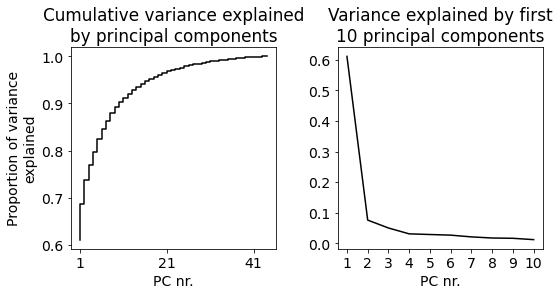

In [123]:
fig, axes = plt.subplots(ncols = 2, figsize = (8,4))

ax = axes[0]
ax.step(x = np.arange(len(pca.explained_variance_ratio_)), y = np.cumsum(pca.explained_variance_ratio_), color = 'k')
ax.set_xticks([0,20,40])
ax.set_xticklabels([1,21,41])
ax.set_title('Cumulative variance explained\nby principal components')
ax.set_ylabel('Proportion of variance\nexplained')
ax.set_xlabel('PC nr.')



ax = axes[1]
ax.plot(np.arange(1,11), pca.explained_variance_ratio_[:10], 'k')
ax.set_xticks(np.arange(1,11))
#ax.set_ylabel('')
ax.set_title('Variance explained by first\n10 principal components')
ax.set_xlabel('PC nr.')

fig.subplots_adjust(wspace = 0.3, left = 0.13, right = 0.95, bottom = 0.15, top = 0.85)

fig_name = 'PCA_variance_explained_aligned_csd.png'

savepath = os.path.join(fig_dir, fig_name)

#fig.savefig(savepath, facecolor = 'w', bbox_to_inches = 'tight')
#ax.set_ylim([0, 1])

In [124]:
(np.cumsum(pca.explained_variance_ratio_) <0.9).sum()

10

#### Reshape components into CSD shape with (space, time) interpolated dimensions

- Histology alignment

In [90]:
# Look at first four components
recon = np.empty((10, sp_len, t_len))
for compNr in range(10):
    recon[compNr] = np.dot(pca.components_[compNr], csd_trial_avg_interp_grand).reshape(sp_len, t_len)*\
                        pca.explained_variance_ratio_[compNr]

- Landmark alignment

In [125]:
# Look at first four components
recon = np.empty((10, sp_len, t_len))
for compNr in range(10):
    recon[compNr] = np.dot(pca.components_[compNr], csd_lm_aligned_interp_grand).reshape(sp_len, t_len)*\
                        pca.explained_variance_ratio_[compNr]

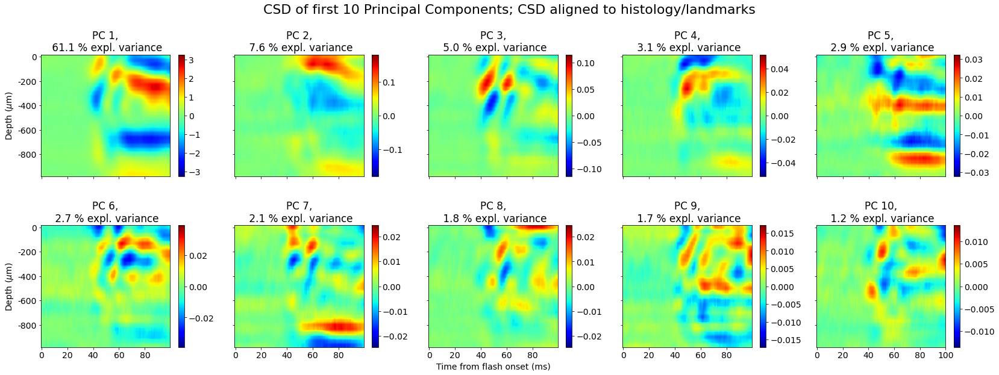

In [126]:


fig, axes = plt.subplots(nrows = 2, ncols = 5, figsize = (24, 9), sharex = True, sharey = True)

fig.subplots_adjust(left = 0.05, right = 0.95, bottom = 0.1, top = 0.85, hspace = 0.4)

for compNr in range(recon.shape[0]):
    irow = compNr // 5
    icol = compNr % 5
    ax = axes[irow, icol]
    csd_plot = recon[compNr]
    #if compNr == 0:
    cmap_range = np.abs(csd_plot).max()*1.2
    im = ax.imshow(csd_plot, cmap = 'jet', vmin = -cmap_range, vmax = cmap_range, aspect = 'auto')
    cb = plt.colorbar(im, ax = ax)
    
    ax.set_xticks(np.arange(0, 120, 20))
    ax.set_xticklabels(np.arange(0,120,20))
    
    ax.set_yticks(np.arange(0, 30, 6))
    ax.set_yticklabels(-np.arange(0,1200,200))
    
    if icol == 0:
        ax.set_ylabel('Depth ($\mu$m)')
    elif icol == 2 and irow == 1:
        ax.set_xlabel('Time from flash onset (ms)')
    
    ax.set_title('PC '+str(compNr+1)+',\n '+str(np.round(pca.explained_variance_ratio_[compNr]*100, 1))+' % expl. variance')
    
    #cbaxes = ax.add_axes([0.96,0.3,0.01, 0.3])
    #cb = fig.colorbar(im, ax = ax, cax = cbaxes)
    #cb.set_ticks([])
    #cb.set_label('CSD ($\mu$A/mm$^3$)', fontsize = 14)
    
fig.suptitle('CSD of first 10 Principal Components; CSD aligned to histology/landmarks', fontsize = 22, y = 0.98, x = 0.5)

fig_name = 'csd_of_10PCs_histology_or_landmark_aligned.png'

savepath = os.path.join(fig_dir, fig_name)

#fig.savefig(savepath, facecolor = 'w')

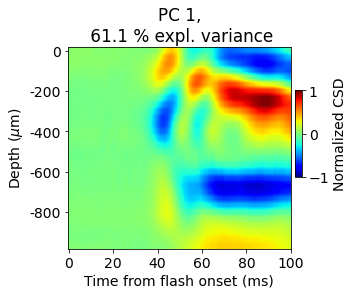

In [127]:


fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (5, 4), sharex = True, sharey = True)

for compNr in range(1):
    #irow = compNr // 5
    icol = compNr % 5
    ax = axes#[irow, icol]
    csd_plot = recon[compNr]
    csd_plot /= np.abs(csd_plot).max()
    #if compNr == 0:
    cmap_range = np.abs(csd_plot).max()
    im = ax.imshow(csd_plot, cmap = 'jet', vmin = -cmap_range, vmax = cmap_range, aspect = 'auto')
    #cb = plt.colorbar(im, ax = ax)
    
    ax.set_xticks(np.arange(0, 120, 20))
    ax.set_xticklabels(np.arange(0,120,20))
    
    ax.set_yticks(np.arange(0, 30, 6))
    ax.set_yticklabels(-np.arange(0,1200,200))
    
    ax.set_title('PC '+str(compNr+1)+',\n '+str(np.round(pca.explained_variance_ratio_[compNr]*100, 1))+' % expl. variance')
    
cbaxes = fig.add_axes([0.81,0.4, 0.02, 0.3])
cb = fig.colorbar(im, ax = ax, cax = cbaxes)
cb.set_label('Normalized CSD', fontsize = 14)
    
ax.set_ylabel('Depth ($\mu$m)')
ax.set_xlabel('Time from flash onset (ms)')

fig.subplots_adjust(left = 0.18, right = 0.8, bottom = 0.15, top = 0.85)
    
#fig.suptitle('CSD of first 10 Principal Components; CSD aligned to landmarks', fontsize = 22, y = 0.98, x = 0.5)

fig_name = 'csd_of_PC1_landmark_aligned.png'

savepath = os.path.join(fig_dir, fig_name)

#fig.savefig(savepath, facecolor = 'w')

### Split sources and sinks and do wasserstein distance calculation from trial-averaged CSD in individual animals to PC 1 CSD

In [128]:
recon_sinks_list = np.empty_like(recon)
recon_sources_list = np.empty_like(recon)

for compNr in range(recon.shape[0]):
    recon_temp = recon[compNr]
    mask_sinks = recon_temp < 0
    mask_sources = recon_temp > 0
    
    sinks_recon_temp = np.zeros_like(recon_temp)
    sinks_recon_temp[mask_sinks] = np.abs(recon_temp[mask_sinks])
    sources_recon_temp = np.zeros_like(recon_temp)
    sources_recon_temp[mask_sources] = np.abs(recon_temp[mask_sources])
    
    recon_sinks_list[compNr] = sinks_recon_temp/sinks_recon_temp.sum()
    recon_sources_list[compNr] = sources_recon_temp/sources_recon_temp.sum()

### Use plain average instead of PC 1

- After landmark alignment

In [105]:
# Downsample
sessions_csd_lm_aligned_interp_ds = dict()
sessions_sinks_lm_aligned_interp = dict()
sessions_sources_lm_aligned_interp = dict()

sp_len = 30; t_len = 100
for session_id in sessions_csd_lm_aligned.keys():
    csd_lm_aligned_orig = sessions_csd_lm_aligned[session_id]
    
    sinks_interp = np.zeros((sp_len, t_len))
    sources_interp = np.zeros((sp_len, t_len))
        
    z = csd_lm_aligned_orig
    x = np.linspace(0., 1., z.shape[1], endpoint=True)
    y = np.linspace(0., 1., z.shape[0], endpoint=True)
    #xx, yy = np.meshgrid(x, y)
    f = interpolate.interp2d(x, y, z, kind='cubic')#, ky = 2)

    x_new = np.linspace(0., 1., t_len, endpoint=True)
    y_new = np.linspace(0., 1., sp_len, endpoint=True)
    csd_interp = f(x_new, y_new)
    
    mask_sinks = csd_interp < 0
    mask_sources = csd_interp > 0
    
    sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
    sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])
    
    sessions_csd_lm_aligned_interp_ds[session_id] = csd_interp#/np.abs(csd_interp).max()
    sessions_sinks_lm_aligned_interp[session_id] = sinks_interp/sinks_interp.sum()
    sessions_sources_lm_aligned_interp[session_id] = sources_interp/sources_interp.sum()

In [106]:
csd_plot_lm_aligned_grand = np.array(list(sessions_csd_lm_aligned_interp_ds.values()))
#csd_trial_avg_interp_grand = csd_trial_avg_interp_grand.reshape(csd_trial_avg_interp_grand.shape[0], 
#                        csd_trial_avg_interp_grand.shape[1]*csd_trial_avg_interp_grand.shape[2])
csd_avg_all_mice = np.mean(csd_plot_lm_aligned_grand, axis = 0)

mask_sinks = csd_avg_all_mice < 0
mask_sources = csd_avg_all_mice > 0

sinks_avg_all_mice_temp = np.zeros(((1,)+csd_avg_all_mice.shape))
sinks_avg_all_mice_temp[0][mask_sinks] = csd_avg_all_mice[mask_sinks]
sources_avg_all_mice_temp = np.zeros(((1,)+csd_avg_all_mice.shape))
sources_avg_all_mice_temp[0][mask_sources] = csd_avg_all_mice[mask_sources]

sinks_avg_all_mice_list = sinks_avg_all_mice_temp/sinks_avg_all_mice_temp.sum()
sources_avg_all_mice_list = sources_avg_all_mice_temp/sources_avg_all_mice_temp.sum()

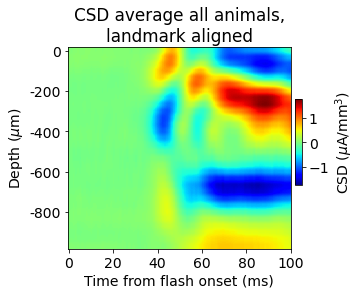

In [107]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (5, 4), sharex = True, sharey = True)

fig.subplots_adjust(left = 0.18, right = 0.8, bottom = 0.15, top = 0.85)

csd_plot = csd_avg_all_mice
#csd_plot /= np.abs(csd_plot).max()

#if compNr == 0:
cmap_range = np.abs(csd_plot).max()
im = ax.imshow(csd_plot, cmap = 'jet', vmin = -cmap_range, vmax = cmap_range, aspect = 'auto')
#cb = plt.colorbar(im, ax = ax)

ax.set_xticks(np.arange(0, 120, 20))
ax.set_xticklabels(np.arange(0,120,20))

ax.set_yticks(np.arange(0, 30, 6))
ax.set_yticklabels(-np.arange(0,1200,200))

cbaxes = fig.add_axes([0.81,0.37, 0.02, 0.3])
cb = fig.colorbar(im, ax = ax, cax = cbaxes)
cb.set_label('CSD ($\mu$A/mm$^3$)', fontsize = 14)

    
ax.set_ylabel('Depth ($\mu$m)')
ax.set_xlabel('Time from flash onset (ms)')

ax.set_title('CSD average all animals,\nlandmark aligned')
    
#fig.suptitle('CSD of first 10 Principal Components; CSD aligned to landmarks', fontsize = 22, y = 0.98, x = 0.5)

fig_name = 'csd_avg_all_animals_landmark_aligned.png'

savepath = os.path.join(fig_dir, fig_name)

#fig.savefig(savepath, facecolor = 'w')

- After histology alignment

In [92]:
csd_trial_avg_interp_grand = np.array(list(sessions_csd_trial_avg_interp.values()))
#csd_trial_avg_interp_grand = csd_trial_avg_interp_grand.reshape(csd_trial_avg_interp_grand.shape[0], 
#                        csd_trial_avg_interp_grand.shape[1]*csd_trial_avg_interp_grand.shape[2])
csd_avg_all_mice = np.mean(csd_trial_avg_interp_grand, axis = 0)

mask_sinks = csd_avg_all_mice < 0
mask_sources = csd_avg_all_mice > 0

sinks_avg_all_mice_temp = np.zeros(((1,)+csd_avg_all_mice.shape))
sinks_avg_all_mice_temp[0][mask_sinks] = csd_avg_all_mice[mask_sinks]
sources_avg_all_mice_temp = np.zeros(((1,)+csd_avg_all_mice.shape))
sources_avg_all_mice_temp[0][mask_sources] = csd_avg_all_mice[mask_sources]

sinks_avg_all_mice_list = sinks_avg_all_mice_temp/sinks_avg_all_mice_temp.sum()
sources_avg_all_mice_list = sources_avg_all_mice_temp/sources_avg_all_mice_temp.sum()

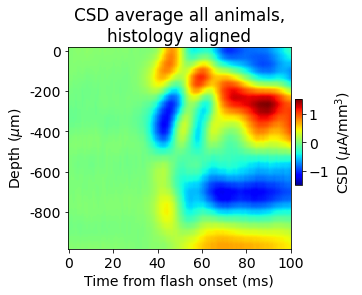

In [93]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (5, 4), sharex = True, sharey = True)

fig.subplots_adjust(left = 0.18, right = 0.8, bottom = 0.15, top = 0.85)

csd_plot = csd_avg_all_mice

#if compNr == 0:
cmap_range = np.abs(csd_plot).max()
im = ax.imshow(csd_plot, cmap = 'jet', vmin = -cmap_range, vmax = cmap_range, aspect = 'auto')
#cb = plt.colorbar(im, ax = ax)

ax.set_xticks(np.arange(0, 120, 20))
ax.set_xticklabels(np.arange(0,120,20))

ax.set_yticks(np.arange(0, 30, 6))
ax.set_yticklabels(-np.arange(0,1200,200))

cbaxes = fig.add_axes([0.81,0.37, 0.02, 0.3])
cb = fig.colorbar(im, ax = ax, cax = cbaxes)
cb.set_label('CSD ($\mu$A/mm$^3$)', fontsize = 14)

    
ax.set_ylabel('Depth ($\mu$m)')
ax.set_xlabel('Time from flash onset (ms)')

ax.set_title('CSD average all animals,\nhistology aligned')
    
#fig.suptitle('CSD of first 10 Principal Components; CSD aligned to landmarks', fontsize = 22, y = 0.98, x = 0.5)

fig_name = 'csd_avg_all_animals_histology_aligned.png'

savepath = os.path.join(fig_dir, fig_name)

#fig.savefig(savepath, facecolor = 'w')

#### Sinks for every animal after landmark alignment

In [129]:
sinks_mice = np.array(list(sessions_sinks_lm_aligned_interp.values()))
sources_mice = np.array(list(sessions_sources_lm_aligned_interp.values()))

#### Sinks for every animal after histology alignment

In [42]:
sinks_mice = np.array(list(sessions_sinks_trial_avg_interp.values()))
sources_mice = np.array(list(sessions_sources_trial_avg_interp.values()))

- Compute WD to PC 1 target after histology or landmark alignment

In [130]:
n_animals = len(sinks_mice)
# for sinks
compNr = 0 # selecting PC 1 component
sink_matrix_recon_exp, M_sink_recon_exp, G0_sink_recon_exp, x_s, x_t = compute_dist_matrix_exp(sinks_mice[:n_animals], 
                                                                             recon_sinks_list[compNr:compNr+1],
                                                                            mode = 'exp_to_reco')

# for sources
source_matrix_recon_exp, M_source_recon_exp, G0_source_recon_exp, x_s, x_t = compute_dist_matrix_exp(sources_mice[:n_animals], 
                                                                             recon_sources_list[compNr:compNr+1],
                                                                            mode = 'exp_to_reco')

# sum wasserstein distances calculated for sinks and sources into one matrix of Wasserstein distances from 
# individual animals to PC 1 CSD
dist_matrix_recon_exp = sink_matrix_recon_exp+source_matrix_recon_exp

100%|██████████| 44/44 [00:28<00:00,  1.56it/s]


- Compute WD to plain average target (after either landmark or histology alignment)

In [109]:
n_animals = len(sinks_mice)
# for sinks
compNr = 0 # selecting PC 1 component
sink_matrix_recon_exp, M_sink_recon_exp, G0_sink_recon_exp, x_s, x_t = compute_dist_matrix_exp(sinks_mice[:n_animals], 
                                                                             sinks_avg_all_mice_list[:],
                                                                            mode = 'exp_to_reco')

# for sources
source_matrix_recon_exp, M_source_recon_exp, G0_source_recon_exp, x_s, x_t = compute_dist_matrix_exp(sources_mice[:n_animals], 
                                                                             sources_avg_all_mice_list[:],
                                                                            mode = 'exp_to_reco')

# sum wasserstein distances calculated for sinks and sources into one matrix of Wasserstein distances from 
# individual animals to PC 1 CSD
dist_matrix_recon_exp = sink_matrix_recon_exp+source_matrix_recon_exp

100%|██████████| 44/44 [00:27<00:00,  1.58it/s]


In [110]:
sinks_avg_all_mice_list.shape

(1, 30, 100)

In [111]:
if np.any(dist_matrix_recon_exp == 0):
    mask = dist_matrix_recon_exp != 0
    dist_matrix_recon_exp = dist_matrix_recon_exp[mask]

### WD between model CSD and target CSD

#### Interpolate and normalize

In [131]:
sims_sinks = dict()
sims_sources = dict()

sims_csd_interp = dict()
sp_len = 30; t_len = 100
n_chans_in_cortex_sim = 21
for sim_name in csd_sims.keys():
    z = csd_sims[sim_name]['trial_avg'][:n_chans_in_cortex_sim,tstim_onset_sim:tstim_onset_sim+100]
    x = np.linspace(0., 1., z.shape[1], endpoint=True)
    y = np.linspace(0., 1., z.shape[0], endpoint=True)
    #xx, yy = np.meshgrid(x, y)
    f = interpolate.interp2d(x, y, z, kind='cubic')

    x_new = np.linspace(0., 1., t_len, endpoint=True)
    y_new = np.linspace(0., 1., sp_len, endpoint=True)
    csd_interp = f(x_new, y_new)

    sims_csd_interp[sim_name] = csd_interp

    mask_sinks = csd_interp < 0
    mask_sources = csd_interp > 0

    sinks_interp = np.zeros_like(csd_interp)
    sources_interp = np.zeros_like(csd_interp)

    sinks_interp[mask_sinks] = np.abs(csd_interp[mask_sinks])
    sources_interp[mask_sources] = np.abs(csd_interp[mask_sources])

    sims_sinks[sim_name] = sinks_interp / sinks_interp.sum()
    sims_sources[sim_name] = sources_interp / sources_interp.sum()


    sims_sinks_list = np.array(list(sims_sinks.values()))
    sims_sources_list = np.array(list(sims_sources.values()))

#### PC 1 target

In [132]:
compNr = 0

dist_matrix_recon_sims = dict()

for sim_name in sims_sinks.keys():
    sink_matrix_recon_sim, M_sink_recon_sim, G0_sink_recon_sim, x_s, x_t = compute_dist_matrix_exp(
                                                                                recon_sinks_list[compNr:compNr+1], 
                                                                                [sims_sinks[sim_name]],
                                                                                mode = 'sim_to_recon')
    
    source_matrix_recon_sim, M_source_recon_sim, G0_source_recon_sim, x_s, x_t = compute_dist_matrix_exp(
                                                                            recon_sources_list[compNr:compNr+1], 
                                                                            [sims_sources[sim_name]],
                                                                            mode = 'sim_to_recon')
    
    dist_matrix_recon_sims[sim_name] = sink_matrix_recon_sim + source_matrix_recon_sim
    

100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


#### Plain average target

In [113]:
compNr = 0

dist_matrix_recon_sims = dict()

for sim_name in sims_sinks.keys():
    sink_matrix_recon_sim, M_sink_recon_sim, G0_sink_recon_sim, x_s, x_t = compute_dist_matrix_exp(
                                                                                sinks_avg_all_mice_list[:], 
                                                                                [sims_sinks[sim_name]],
                                                                                mode = 'sim_to_recon')
    
    source_matrix_recon_sim, M_source_recon_sim, G0_source_recon_sim, x_s, x_t = compute_dist_matrix_exp(
                                                                            sources_avg_all_mice_list[:], 
                                                                            [sims_sources[sim_name]],
                                                                            mode = 'sim_to_recon')
    
    dist_matrix_recon_sims[sim_name] = sink_matrix_recon_sim + source_matrix_recon_sim
    

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


In [133]:
sim_names = list(dist_matrix_recon_sims.keys())

['final_model', 'intermediate_model', 'old_model']
old_model
intermediate_model
final_model


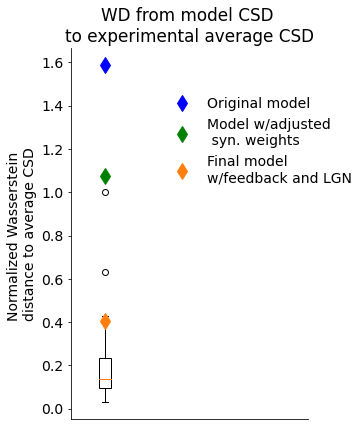

In [115]:
fig = plt.figure(figsize = (5.5,6))

ax = fig.add_subplot(1,1,1)

fig.subplots_adjust(left = 0.2, right = 0.8, bottom = 0.03, top = 0.89)

bp1 = ax.boxplot(x = dist_matrix_recon_exp[:,compNr]/dist_matrix_recon_exp[:,compNr].max(), positions = [1], widths = [0.07], patch_artist = True, \
                         boxprops=dict(facecolor="white"))


sim_names = sorted(list(dist_matrix_recon_sims.keys()))
#sim_names = sim_names[1:] + [sim_names[0]]
print(sim_names)

for isim, sim_name in enumerate(sim_names[::-1]):
    print(sim_name)

    ax.plot(1, dist_matrix_recon_sims[sim_name]/dist_matrix_recon_exp[:,compNr].max(), 'd', markersize = '12', color = sims_colors[sim_name], label = sims_labels[sim_name])

ax.set_xticks([])
ax.set_ylabel('Normalized Wasserstein \ndistance to average CSD')
#ax.set_ylabel('PDF')

ax.set_xlim([0.8, 2.2])

fig.legend(bbox_to_anchor = (0.92,0.8), frameon=False)

ax.set_title('WD from model CSD \nto experimental average CSD')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


#fig_name = 'smooth_pdf_WD_distr_animals_to_PC1.png'

fig_name = 'WD_distr_exp_and_sim_to_plain_avg_landmark_aligned.png'
savepath = os.path.join(fig_dir, fig_name)

#fig.savefig(savepath, facecolor='w')

['intermediate_model', 'old_model', 'final_model']
final_model
intermediate_model
old_model


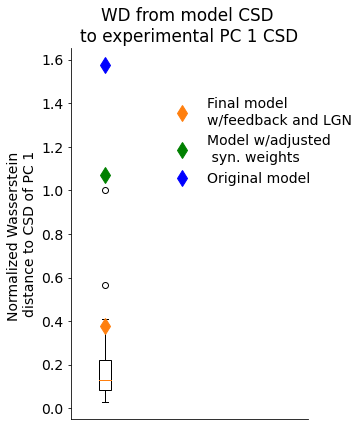

In [134]:
fig = plt.figure(figsize = (5.5,6))

ax = fig.add_subplot(1,1,1)

fig.subplots_adjust(left = 0.2, right = 0.8, bottom = 0.03, top = 0.89)

bp1 = ax.boxplot(x = dist_matrix_recon_exp[:,compNr]/dist_matrix_recon_exp[:,compNr].max(), positions = [1], widths = [0.07], patch_artist = True, \
                         boxprops=dict(facecolor="white"))


sim_names = sorted(list(dist_matrix_recon_sims.keys()))
sim_names = sim_names[1:] + [sim_names[0]]
print(sim_names)

for isim, sim_name in enumerate(sorted(sim_names)):
    print(sim_name)

    ax.plot(1, dist_matrix_recon_sims[sim_name]/dist_matrix_recon_exp[:,compNr].max(), 'd', markersize = '12', color = sims_colors[sim_name], label = sims_labels[sim_name])

ax.set_xticks([])
ax.set_ylabel('Normalized Wasserstein \ndistance to CSD of PC 1')
#ax.set_ylabel('PDF')

ax.set_xlim([0.8, 2.2])

fig.legend(bbox_to_anchor = (0.92,0.8), frameon=False)

ax.set_title('WD from model CSD \nto experimental PC 1 CSD')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


#fig_name = 'smooth_pdf_WD_distr_animals_to_PC1.png'

fig_name = 'WD_distr_exp_and_sim_to_PC1_'+sim_name+'.png'

savepath = os.path.join('Figures', 'Figure_6', fig_name)

#fig.savefig(savepath, facecolor='w')

['intermediate_model', 'old_model', 'final_model']
old_model
intermediate_model
final_model


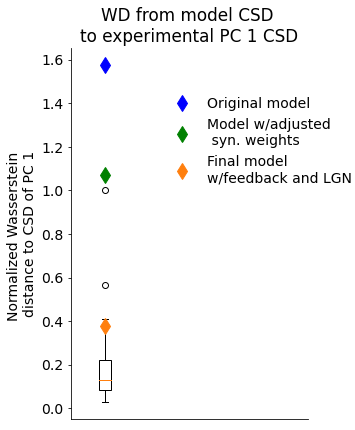

In [112]:
fig = plt.figure(figsize = (5.5,6))

ax = fig.add_subplot(1,1,1)

fig.subplots_adjust(left = 0.2, right = 0.8, bottom = 0.03, top = 0.89)

bp1 = ax.boxplot(x = dist_matrix_recon_exp[:,compNr]/dist_matrix_recon_exp[:,compNr].max(), positions = [1], widths = [0.07], patch_artist = True, \
                         boxprops=dict(facecolor="white"))


sim_names = sorted(list(dist_matrix_recon_sims.keys()))
sim_names = sim_names[1:] + [sim_names[0]]
print(sim_names)

for isim, sim_name in enumerate(sorted(sim_names)[::-1]):
    print(sim_name)

    ax.plot(1, dist_matrix_recon_sims[sim_name]/dist_matrix_recon_exp[:,compNr].max(), 'd', markersize = '12', color = sims_colors[sim_name], label = sims_labels[sim_name])

ax.set_xticks([])
ax.set_ylabel('Normalized Wasserstein \ndistance to CSD of PC 1')
#ax.set_ylabel('PDF')

ax.set_xlim([0.8, 2.2])

fig.legend(bbox_to_anchor = (0.92,0.8), frameon=False)

ax.set_title('WD from model CSD \nto experimental PC 1 CSD')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


#fig_name = 'smooth_pdf_WD_distr_animals_to_PC1.png'

fig_name = 'WD_distr_exp_and_sim_to_PC1_landmark_aligned.png'

savepath = os.path.join(fig_dir, fig_name)

#fig.savefig(savepath, facecolor='w')